# 0.-Inicialización-del-entorno

In [1]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',1000)
import itertools
import warnings
warnings.filterwarnings("ignore")
import io

from plotly.offline import init_notebook_mode, plot,iplot
import plotly.graph_objs as go
init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization

import seaborn as sns

import sklearn as skn
from sklearn import preprocessing
from sklearn.cluster import KMeans, MeanShift, estimate_bandwidth, AgglomerativeClustering
from sklearn import decomposition
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.preprocessing import OrdinalEncoder, StandardScaler, RobustScaler, MinMaxScaler
from sklearn.datasets import make_blobs
import scipy.cluster.hierarchy as sch
from scipy.cluster.hierarchy import dendrogram

import sys
in_colab = 'google.colab' in sys.modules

In [2]:
if in_colab:
  df=pd.read_csv("https://raw.githubusercontent.com/gbrlm/tp_nosupervisado/main/players_20.csv")
else:
  df=pd.read_csv("players_20.csv")

# 1.-Análisis general de los datos

Para conocer el dataset listamos las columnas, exploramos las distribuciones en cuanto a edad, peso y overall. Que países tienen mas jugadores en la FIFA y los salarios diferenciando a los jugadores con mayor overall
observando algunos sueldos muy por encima del resto.

También listamos los jugadores con mayor desempeño por posición y los clubes que acumulan mayor overall.

Finalmente vemos que el porcentaje de jugadores de reserva y suplentes representa el ~ 59% del dataset.

In [3]:
# Columnas del dataset
print(df.columns.values)

['sofifa_id' 'player_url' 'short_name' 'long_name' 'age' 'dob' 'height_cm'
 'weight_kg' 'nationality' 'club' 'overall' 'potential' 'value_eur'
 'wage_eur' 'player_positions' 'preferred_foot' 'international_reputation'
 'weak_foot' 'skill_moves' 'work_rate' 'body_type' 'real_face'
 'release_clause_eur' 'player_tags' 'team_position' 'team_jersey_number'
 'loaned_from' 'joined' 'contract_valid_until' 'nation_position'
 'nation_jersey_number' 'pace' 'shooting' 'passing' 'dribbling'
 'defending' 'physic' 'gk_diving' 'gk_handling' 'gk_kicking' 'gk_reflexes'
 'gk_speed' 'gk_positioning' 'player_traits' 'attacking_crossing'
 'attacking_finishing' 'attacking_heading_accuracy'
 'attacking_short_passing' 'attacking_volleys' 'skill_dribbling'
 'skill_curve' 'skill_fk_accuracy' 'skill_long_passing'
 'skill_ball_control' 'movement_acceleration' 'movement_sprint_speed'
 'movement_agility' 'movement_reactions' 'movement_balance'
 'power_shot_power' 'power_jumping' 'power_stamina' 'power_strength'
 'po

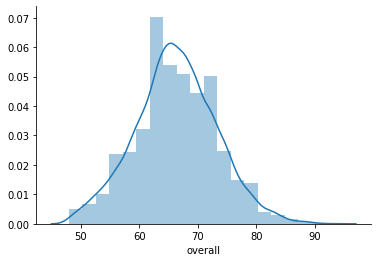

In [4]:
# Histograma del desempeño general 'overall' 

sns.distplot(df.overall, bins=20, kde=True, norm_hist=True)
sns.despine()

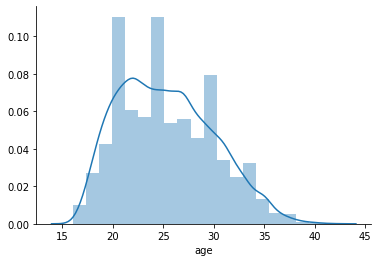

In [5]:
# Edad de los jugadores

sns.distplot(df.age, bins=20, kde=True, norm_hist=True)
sns.despine()

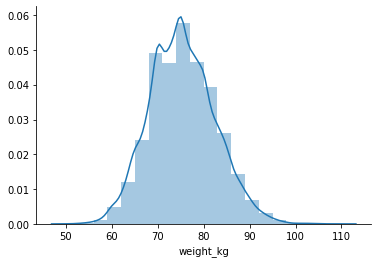

In [6]:
# El peso de los jugadores
sns.distplot(df.weight_kg, bins=20, kde=True, norm_hist=True)
sns.despine()

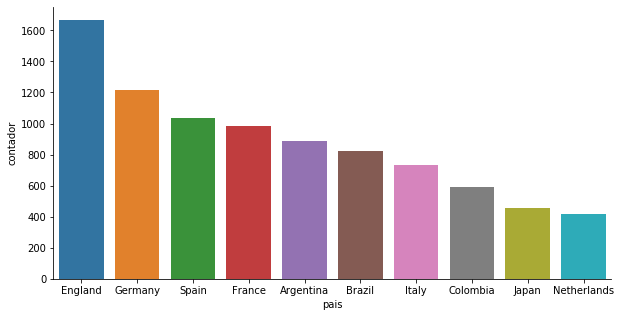

In [7]:
# 10 paises con mas jugadores en la FIFA

plt.figure(figsize=(10,5))
sns.barplot(x="pais", y="contador", data=df.groupby(['nationality']). \
            sofifa_id.count().sort_values(ascending=False).rename_axis(["pais"]).rename('contador').reset_index().head(10))
sns.despine()

In [8]:
# 10 paises con mas jugadores en la FIFA
df.groupby(['nationality']).sofifa_id.count().sort_values(ascending=False).rename_axis(["País"]).rename('Contador').reset_index().head(10)

,País,Contador
0,England,1667
1,Germany,1216
2,Spain,1035
3,France,984
4,Argentina,886
5,Brazil,824
6,Italy,732
7,Colombia,591
8,Japan,453
9,Netherlands,416


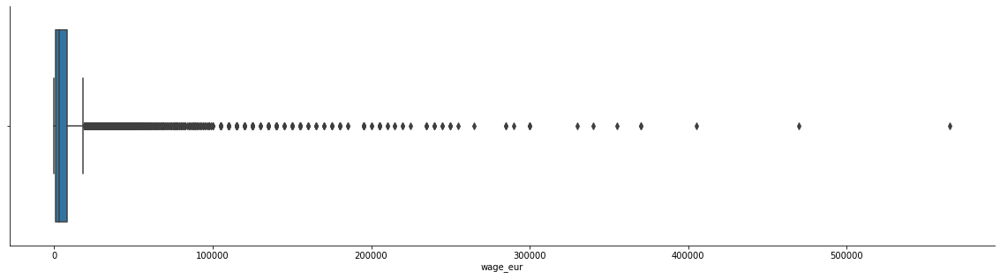

In [9]:
# Salario de los jugadores

plt.figure(figsize=(20,5))
sns.boxplot(x=df['wage_eur'])
sns.despine()

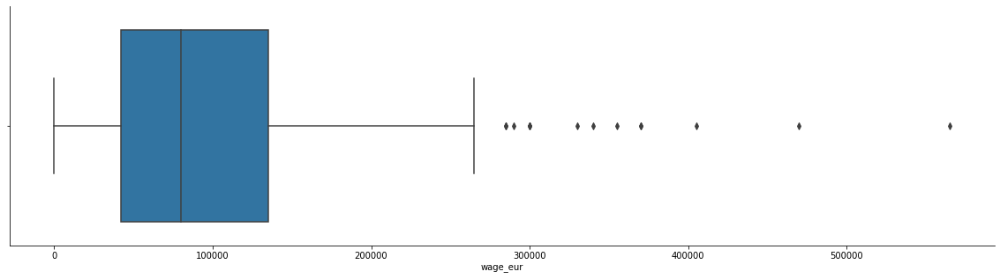

In [10]:
# Salario de los jugadores con mayor overall

plt.figure(figsize=(20,5))
sns.boxplot(x=df[ df.overall > 80 ].wage_eur)
sns.despine()

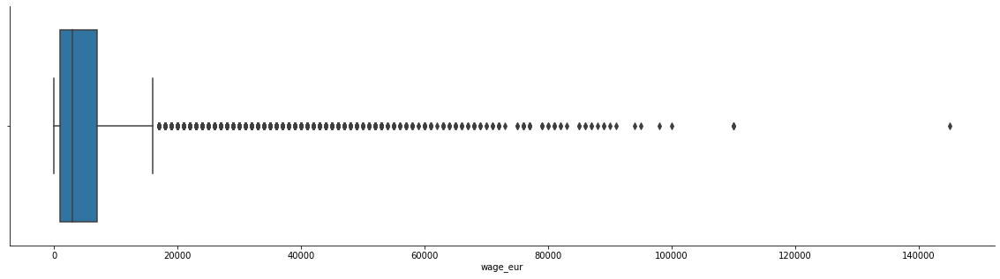

In [11]:
# Salario del resto de los jugadores

plt.figure(figsize=(20,5))

sns.boxplot(x=df[ df.overall < 80 ].wage_eur)
sns.despine()

In [12]:
# Mejores jugadores por posición
best_players_per_position=df.iloc[df.groupby(df['team_position'])['overall'].idxmax()][['player_positions','short_name','overall']]
best_players_per_position.sort_values(by='overall', ascending=False)

,player_positions,short_name,overall
0,"RW, CF, ST",L. Messi,94
1,"ST, LW",Cristiano Ronaldo,93
2,"LW, CAM",Neymar Jr,92
3,GK,J. Oblak,91
5,"CAM, CM",K. De Bruyne,91
7,CB,V. van Dijk,90
12,ST,H. Kane,89
21,"CDM, CM",Sergio Busquets,89
29,CB,Piqué,88
33,"CAM, CM",David Silva,88


In [13]:
# Valores general promedio de clubs
club_avg_overall=df.groupby("club")["overall"].mean().reset_index().sort_values("overall",ascending=False)
club_avg_overall.head(10)

,club,overall
226,FC Bayern München,81.304348
505,Real Madrid,80.121212
350,Juventus,80.060606
650,Uruguay,78.608696
224,FC Barcelona,78.363636
407,Mexico,78.000000
426,Netherlands,78.000000
166,Colombia,78.000000
77,Bayer 04 Leverkusen,77.280000
141,Chelsea,77.060606


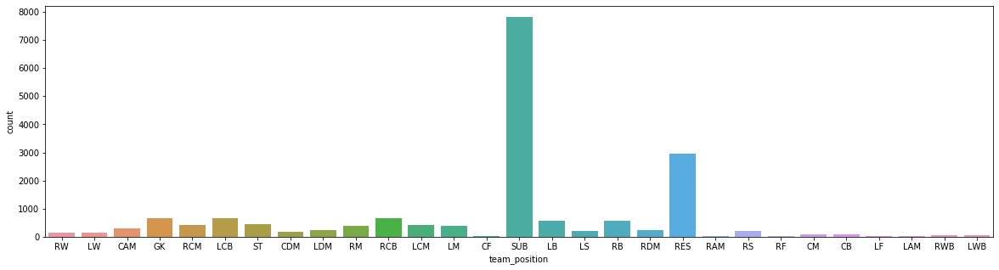

In [14]:
# Posiciones de los jugadores en los equipos.
# Vemos la cantidad de jugadores SUB (suplentes) y RES (reserva) vs los titulares.
#
# SUB: Substitutes – players who do not start playing but that can get in during the match.
# RES: Reserves – players who belong to the squad but that do not play or sit on the bench.
# Fuente: https://www.fifauteam.com/fifa-ultimate-team-definitions-and-abbreviations/

plt.figure(figsize=(20,5))
sns.countplot(df.team_position)

In [15]:
print("Porcentaje de jugadores de Reserva y Suplentes: {}".format((df[(df.team_position == 'SUB') | (df.team_position == 'RES')].team_position.count() * 100) / df.shape[0]))

Porcentaje de jugadores de Reserva y Suplentes: 58.96706423022213


# 2.-Preparación-de-los-datos

**Retiramos jugadores con bajo Desempeño global ("overall"), reducimos el tamaño de la base y consideramos variables de desempeño por habilidad (skills_ratings)**

In [16]:
n=10000 # Cantidad de jugadores a considerar

df_n=df.loc[:n] # Se reduce la base a los n primeros jugadores

df_n=df_n[(df_n['overall']>70)]
skills_ratings = ['attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 
'attacking_short_passing', 'attacking_volleys','skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 
'skill_long_passing', 'skill_ball_control', 'movement_acceleration',  'movement_sprint_speed',
'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping',
'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking',
'defending_standing_tackle', 'defending_sliding_tackle', 
'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',  'goalkeeping_positioning','goalkeeping_reflexes']

print('Consideramos', len(skills_ratings), 'variables numéricas de desempeño según habilidad')

Consideramos 34 variables numéricas de desempeño según habilidad


In [17]:
df_n[skills_ratings].dtypes

attacking_crossing            int64
attacking_finishing           int64
attacking_heading_accuracy    int64
attacking_short_passing       int64
attacking_volleys             int64
skill_dribbling               int64
skill_curve                   int64
skill_fk_accuracy             int64
skill_long_passing            int64
skill_ball_control            int64
movement_acceleration         int64
movement_sprint_speed         int64
movement_agility              int64
movement_reactions            int64
movement_balance              int64
power_shot_power              int64
power_jumping                 int64
power_stamina                 int64
power_strength                int64
power_long_shots              int64
mentality_aggression          int64
mentality_interceptions       int64
mentality_positioning         int64
mentality_vision              int64
mentality_penalties           int64
mentality_composure           int64
defending_marking             int64
defending_standing_tackle   

**Se crea el jugador perfecto para ver a donde se ubica en nuestra visualización**

In [18]:
MachineGunDict={'short_name':'MachineGun','long_name':'MachineGun','overall':99,'player_positions':'RW'}
for skills in skills_ratings:
    MachineGunDict[skills]=99

df_n=df_n.append(MachineGunDict,ignore_index=True)

In [19]:
df_skills = df_n[skills_ratings]

In [20]:
# Checkeamos si hay valores nulos en las skills
print('Existen valores nulos en habilidades:', df_skills.isnull().values.any())

Existen valores nulos en habilidades: False


In [21]:
# Checkeamos si hay valores nulos en las posiciones
print('Existen jugadores sin posiciones definidas:             ', df_n['player_positions'].isnull().sum())
print('Existen jugadores sin posiciones definidas en equipos:  ', df_n['team_position'].isnull().sum())
print('Existen jugadores sin posiciones definidas en naciones: ', df_n['nation_position'].isnull().sum())

Existen jugadores sin posiciones definidas:              0
Existen jugadores sin posiciones definidas en equipos:   98
Existen jugadores sin posiciones definidas en naciones:  3942


In [22]:
# Defino una posición principal para jugadores tomando la primer posición que aparece
# en la columna 'player_position'
df_n['main_position'] = df_n.player_positions.apply(lambda x: x[0:3].strip(','))

In [23]:
forwards=['ST','LW','RW','CF']
midfielders=['CAM','LM','CM','RM','CDM']
defenders=['LWB','RWB','LB','CB','RB']
goalkeepers=['GK']

def pos2(position):
    if position in forwards:
        return 'Forward'
    
    elif position in midfielders:
        return 'Midfielder'
    
    elif position in defenders:
        return 'Defender'
    
    elif position in goalkeepers:
        return 'GK'
    
    else:
        return 'nan'
    
df_n["position"]=df_n["main_position"].apply(lambda x: pos2(x))

# 3.-Exploratorio-Visual-para-Clustering

**Visualizamos los datos de a dos variables numéricas**

Posteriormente a la matriz de correlación hacemos un recorrido general agrupando visualizaciones por skills, ataque, movimiento, poder, mentalidad, defensa y arqueros.

Bajo cada pairplot se coloca una descripción de la variable de habilidad.

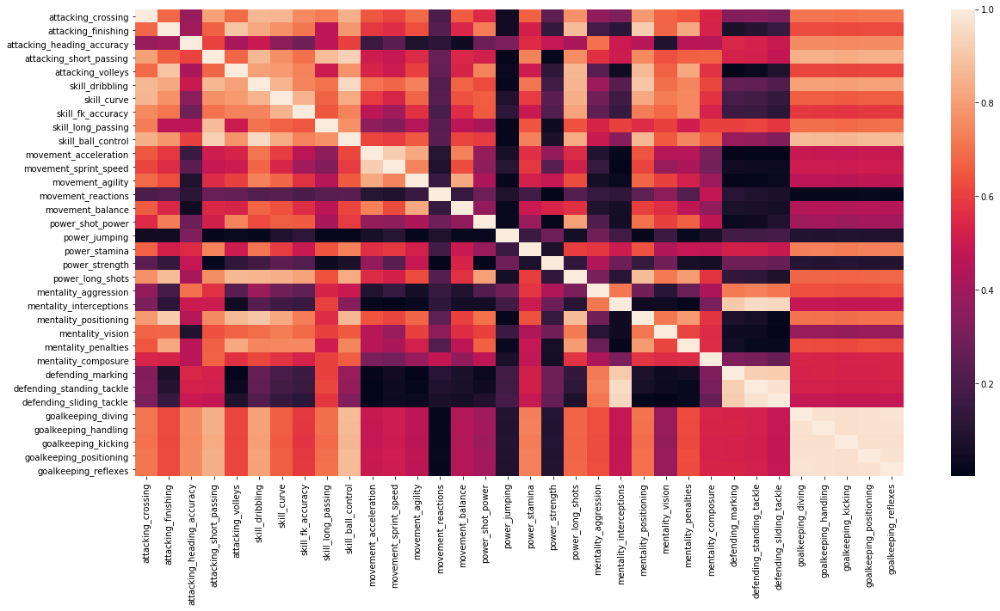

In [24]:
# Análisis de matriz de correlación de las habilidades
corr_mat = df_skills.corr().abs()
plt.figure(figsize=(20,10))
ax = sns.heatmap(corr_mat)

<Figure size 1440x720 with 0 Axes>

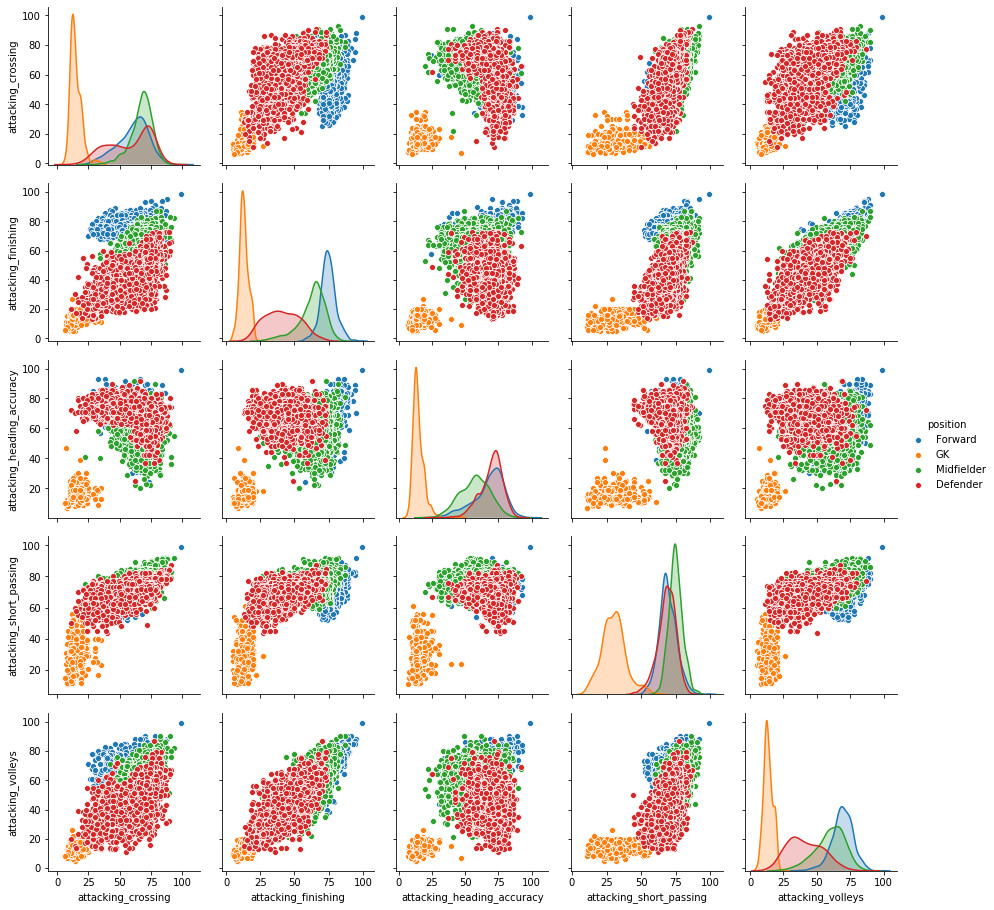

In [25]:
# pairplot de ataque por posición
atk_features = [col for col in df_skills.columns if 'attacking_' in col]
atk_features.append('position')
plt.figure(figsize=(20,10))
sns.pairplot(df_n[atk_features], hue='position')

CROSSING: Este atributo mide la precisión con la que el jugador cruza el balón durante la carrera normal y las jugadas a balón parado.

FINISHING: El remate es la precisión de los tiros con el pie, dentro del área de penalti.

HEADING ACCURACY: Se aplica tanto a los pases de cabeza como a los cabezazos al arco.

SHORT PASSING: Este atributo clasifica qué tan bien un jugador realiza un pase corto / terrestre a su compañero de equipo.

VOLLEYS: Este atributo mide la precisión y la potencia de las voleas al gol. Afecta la técnica y la precisión de los tiros realizados mientras el balón está en el aire.

<Figure size 1440x720 with 0 Axes>

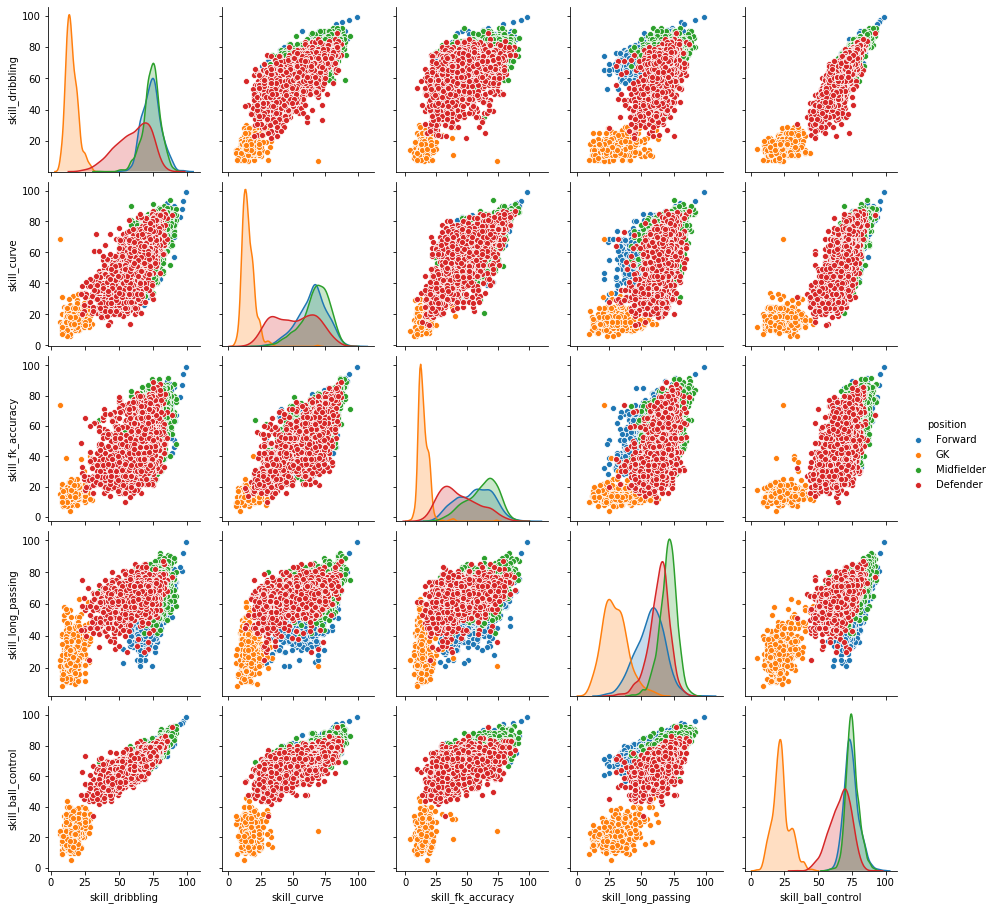

In [26]:
# pairplot de las habilidad por posición
ski_features = [col for col in df_skills.columns if 'skill_' in col]
ski_features.append('position')
plt.figure(figsize=(20,10))
sns.pairplot(df_n[ski_features], hue='position')

DRIBBLING: Es la capacidad del jugador para llevar la pelota y pasar a un oponente.

CURVE: Se utiliza para medir la capacidad del jugador para curvar la pelota al dar un pase y disparar.

FREE KICK ACCURACY: Se utiliza para medir la precisión del jugador para ejecutar tiros libres.

LONG PASSING: Se usa para clasificar qué tan bien un jugador realiza un pase largo en el aire a su compañero de equipo (No afecta a los pases largos por tierra.).

BALL CONTROL: es la capacidad de un jugador de controlar el balón a medida que lo recibe. 

<Figure size 1440x720 with 0 Axes>

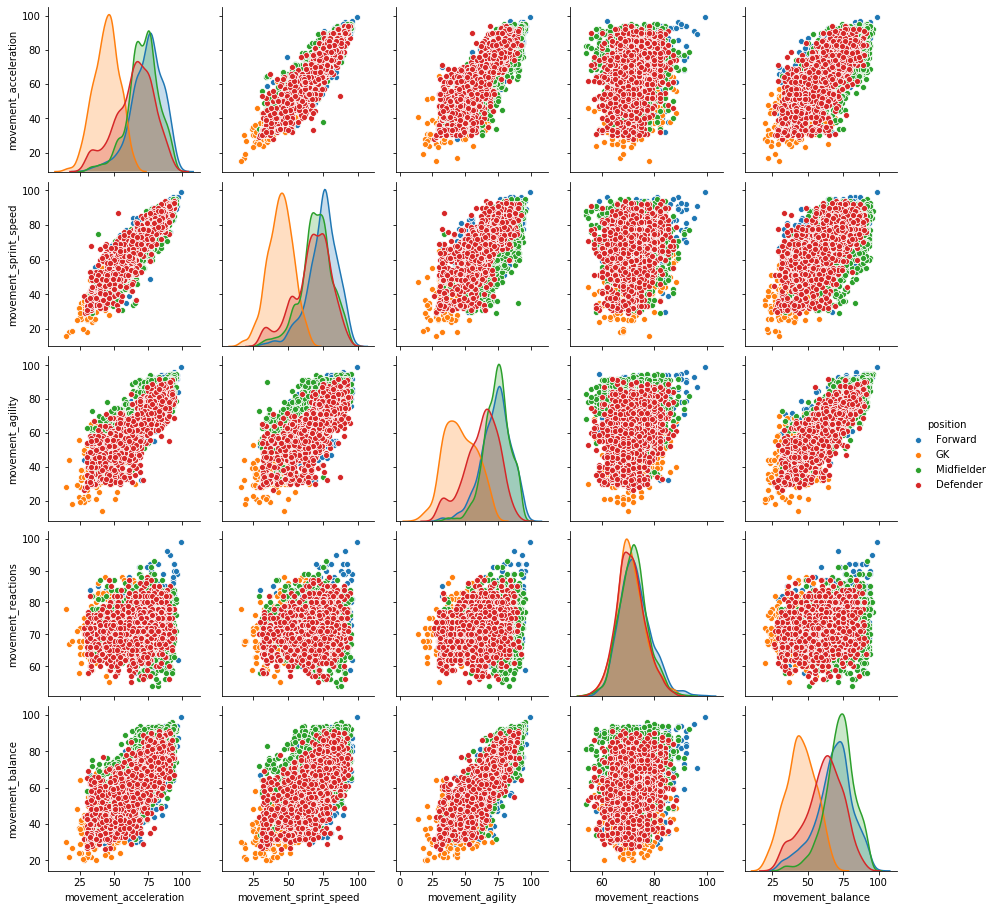

In [27]:
# pairplot de movimimiento por posición
mvn_features = [col for col in df_skills.columns if 'movement_' in col]
mvn_features.append('position')
plt.figure(figsize=(20,10))
sns.pairplot(df_n[mvn_features], hue='position')

ACCELERATION: Es el incremento de la velocidad de carrera de un jugador.

SPRINT SPEED: mide qué tan rápido corre el jugador mientras está a máxima velocidad.

AGILITY: Mide qué tan ágil es el jugador mientras se mueve o gira.

REACTIONS: Mide la rapidez con la que un jugador responde a una situación que ocurre a su alrededor.

BALANCE: Es la capacidad de mantener el equilibrio después de un desafío físico.

<Figure size 1440x720 with 0 Axes>

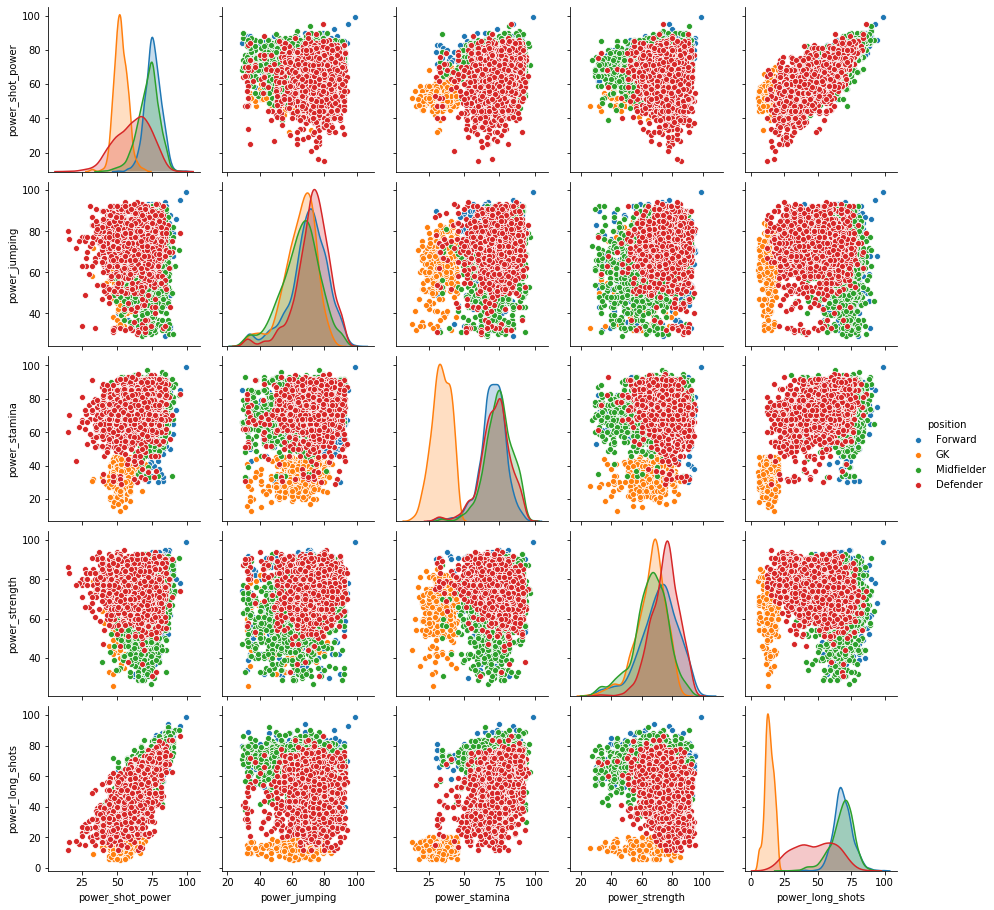

In [28]:
# pairplot de poder por posición
pwr_features = [col for col in df_skills.columns if 'power_' in col]
pwr_features.append('position')
plt.figure(figsize=(20,10))
sns.pairplot(df_n[pwr_features], hue='position')

SHOT POWER: evalúa la fuerza con la que el jugador golpea la pelota cuando realiza un tiro al arco.

JUMPING: Es la habilidad y la calidad del jugador para saltar desde la superficie para encabezar.

STAMINA: Determina la velocidad a la que un jugador se cansará durante un juego. 

STREGTH: Tiene que ver con la calidad o el estado de ser físicamente fuerte. Cuanto mayor sea el valor, más probabilidades habrá de que el jugador gane un desafío físico.

LONG SHOTS: Mide la precisión de los tiros desde fuera del área de penalti.

<Figure size 1440x720 with 0 Axes>

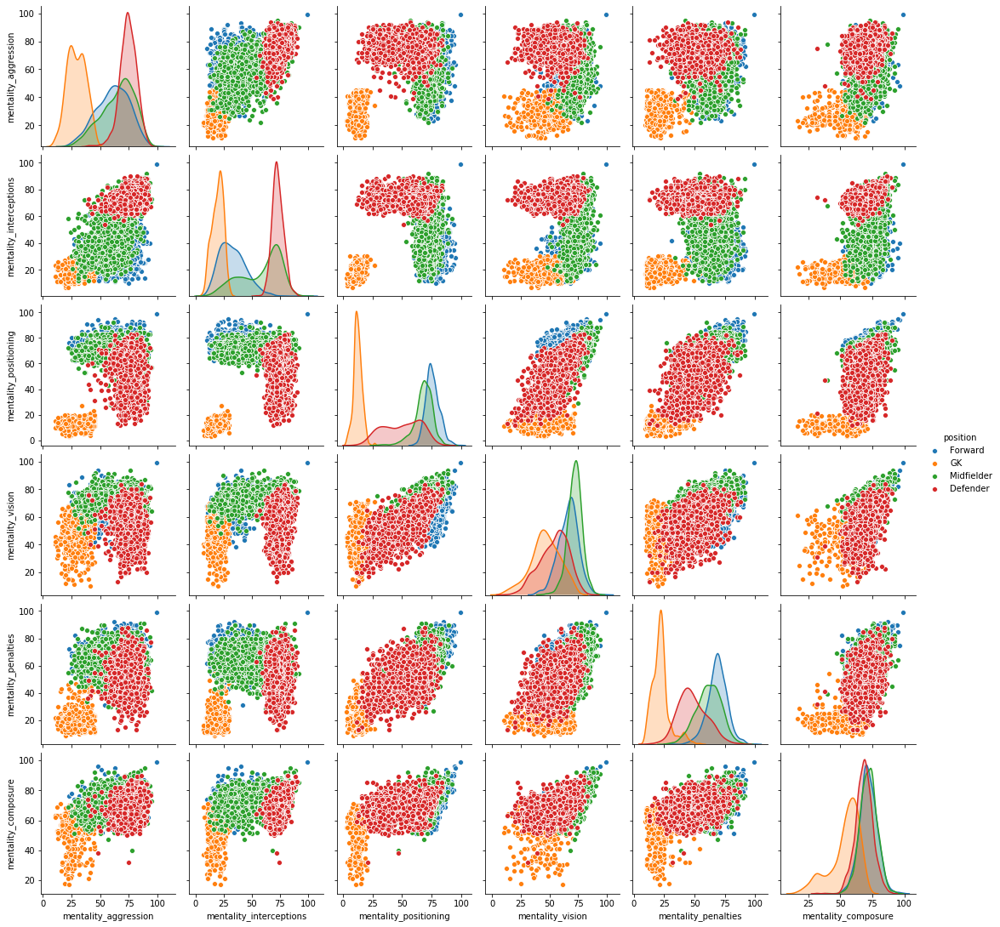

In [29]:
# pairplot de mentalidad por posición
mtl_features = [col for col in df_skills.columns if 'mentality_' in col]
mtl_features.append('position')
plt.figure(figsize=(20,10))
sns.pairplot(df_n[mtl_features], hue='position')

AGGRESSION: Mide la frecuencia y la agresión de los empujones, tacleadas y tacleadas deslizantes. Es el atributo que determina el poder de voluntad o el compromiso del jugador con un partido.

INTERCEPTIONS: Determina la capacidad de leer el juego e interceptar pases.

POSITIONING: Es la capacidad del jugador para tomar buenas posiciones en el campo durante un juego. Cuanto más alta sea esta estadística, más probable es que un jugador haga suficiente espacio para recibir la pelota en áreas peligrosas.

VISION: Clasifica la conciencia del jugador de la posición de sus compañeros de equipo y oponentes a su alrededor. Es el atributo que aumenta (o reduce) las posibilidades de un pase largo exitoso.

PENALTIES: Mide la precisión de los tiros desde el interior del área de penal.

COMPOSURE: Determina a qué distancia el jugador con el balón comienza a sentir la presión del oponente. Esto luego afecta las posibilidades de que el jugador cometa un error cuando dispara, pasa y cruza. Cuanto mayor sea el valor, mejor se desempeñará el jugador bajo la presión de un oponente.

<Figure size 1440x720 with 0 Axes>

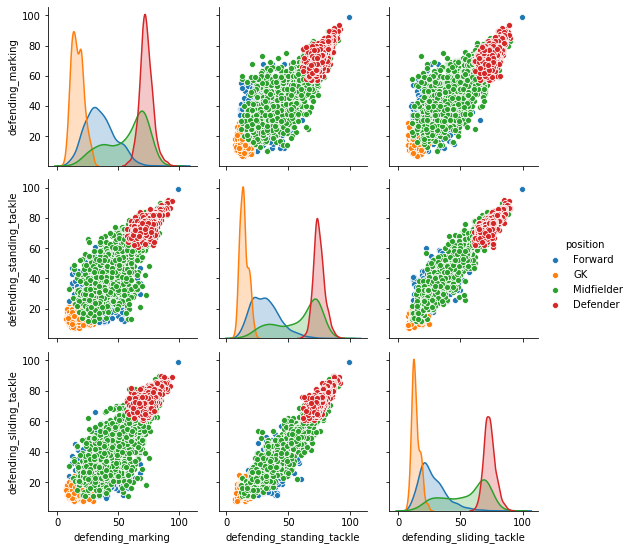

In [30]:
# pairplot de defensa por posición
dfn_features = [col for col in df_skills.columns if 'defending_' in col]
dfn_features.append('position')
plt.figure(figsize=(20,10))
sns.pairplot(df_n[dfn_features], hue='position')

MARKING: es la capacidad de rastrear y defender a un jugador contrario. En otras palabras, es la capacidad de su jugador para permanecer cerca de un atacante contrario y evitar que llegue a un centro / pase de un compañero de equipo. 

STANDING TACKLE: Miden la capacidad del jugador para cronometrar los tackles deslizantes para que ganen el balón en lugar de regalar una falta.

SLIDING TACKLE: Miden la capacidad del jugador para cronometrar los tackles deslizantes para que ganen el balón en lugar de regalar una falta.

<Figure size 1440x720 with 0 Axes>

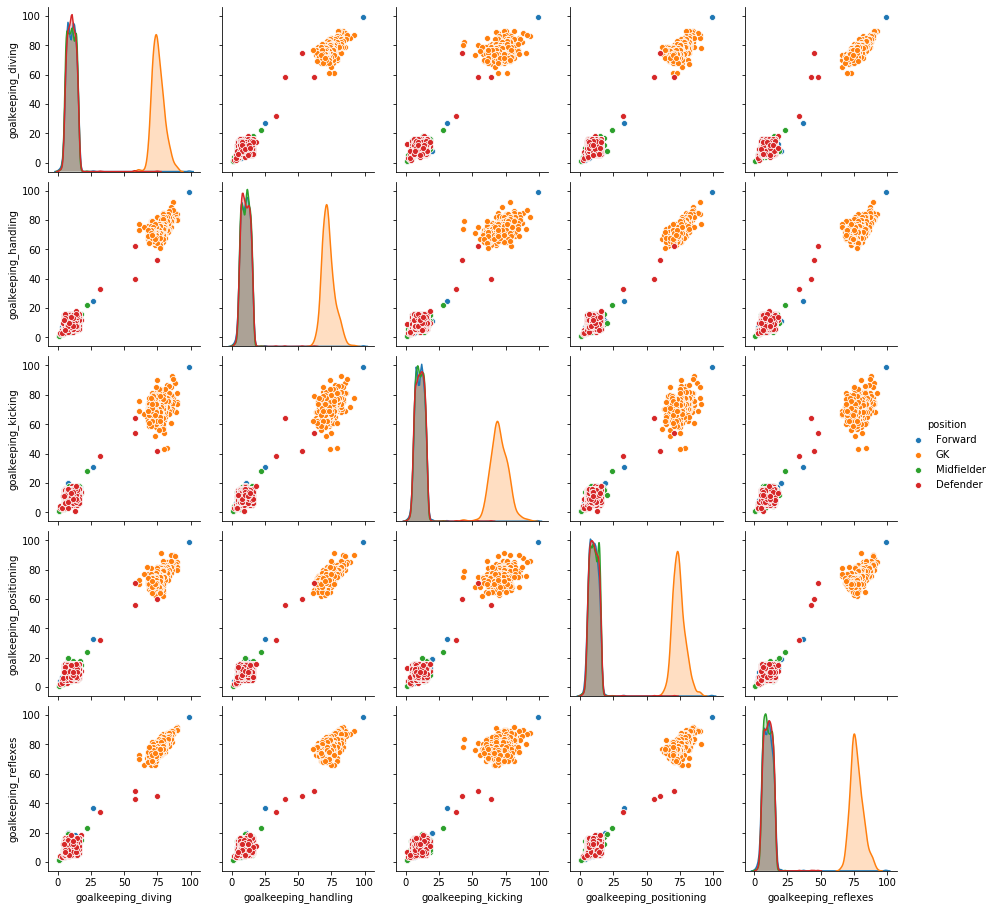

In [31]:
# pairplot de arqueros por posición
glk_features = [col for col in df_skills.columns if 'goalkeeping_' in col]
glk_features.append('position')
plt.figure(figsize=(20,10))
sns.pairplot(df_n[glk_features], hue='position')

DIVING: Es la capacidad de GK para hacer una salvada por el aire. Se ve afectado directamente por la altura del jugador.

HANDLING: Exclusivo del portero que se usa para medir la limpieza con la que atrapa el balón y lo agarra.

KICKING: Es otro atributo que solo tienen los porteros, que se utiliza para medir la longitud y precisión de los saques de meta, desde fuera de las manos o desde el suelo.

POSITIONING: Es la capacidad del GK para posicionarse correctamente al salvar tiros. También afecta la forma en que un portero reacciona a los centros.

REFLEXES: Es la agilidad del portero al realizar una parada.

In [32]:
# Convertimos la columna 'main_position' en variables categóricas
df_n['main_position'] = df_n['main_position'].astype('category')
# Asignamos valores numéricos a las variables de posición
df_n['position_cat'] = df_n['main_position'].cat.codes

In [33]:
# Convertimos la columna 'position' en variables categóricas numérica para obtener una escala de colores
df_n['position'] = df_n['position'].astype('category')
# Asignamos valores numéricos a las variables de posición
df_n['position_color'] = df_n['position'].cat.codes

El siguiente gráfico si lo ejecuta desde Colab se descargará localmente a su computadora con el nombre plot-grafico-1.html

In [34]:
#Gráfico 1

#Elegimos un jugador
search_player=df_n["short_name"]=='L. Messi' 

bool_crack=df_n["overall"] > 85
bool_elecc=df_n["club"]=='FC Barcelona' 
bool_no_crack=df_n["overall"]<86
bool_machinegun=df_n["short_name"]=='MachineGun'

#Elegir dos números entre 0 y de n_skills-1
skill_1=skills_ratings[6]  #6
skill_2=skills_ratings[25]  #25

palette=['navy','red','#A2D5F2','orange','green','pink']

data=[]

n_crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Crack (Overall>85)',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=15,color='black'),
                      opacity=0.9,marker=dict(color=palette[2],size=7),mode='markers+text')

n_no_crack =go.Scatter(x=df_skills.loc[bool_no_crack,skill_1], y=df_skills.loc[bool_no_crack,skill_2],name='Average player',
                         text=df_n.loc[bool_no_crack,'short_name'],
                         opacity=0.6,marker=dict(color=palette[1],size=3),mode='markers')

n_elecc=go.Scatter(x=df_skills.loc[bool_elecc,skill_1], y=df_skills.loc[bool_elecc,skill_2],name='Elección (Club FC Barcelona)',
                     text=df_n.loc[bool_elecc,'short_name'],
                     opacity=0.6,marker=dict(color=palette[0],size=5),mode='markers')

n_machinegun =go.Scatter(x=df_skills.loc[bool_machinegun,skill_1], y=df_skills.loc[bool_machinegun,skill_2],name='Perfect player',
                           textfont=dict(family='sans serif',size=15,color='black'),
                           opacity=0.6,marker=dict(color=palette[3],size=15),mode='markers+text')

picked_player =go.Scatter(x=df_skills.loc[search_player,skill_1], y=df_skills.loc[search_player,skill_2],name='Searched player',
                            text=df_n.loc[search_player,'short_name'],
                            textfont=dict(family='sans serif',size=15,color='black'),
                            opacity=1,marker=dict(color=palette[4],size=15),mode='markers+text')

data=[n_crack,n_no_crack,n_elecc,n_machinegun,picked_player]

layout = go.Layout(title="Fifa Players",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=2000,height=1000)

fig = go.Figure(data=data, layout=layout)

if in_colab:
  from google.colab import files
  fig.write_html('plot-grafico-1.html')
  files.download('plot-grafico-1.html')
else:
  iplot(fig)

# 4.-Clustering-con-Kmeans
Es necesario definirle la cantidad de grupos/clusters (n_clusters), es un hiperparámetro del algoritmo (definimos 4 clusters inicialmente). 

In [35]:
# Número de clusters buscado
n_clust = 4

km = KMeans(n_clusters=n_clust)
km.fit(df_skills)
# Recuperacion de etiquetas
clusters_km = km.labels_
print('Suma de los cuadrados de las distancias al cluster / Inertia: ', km.inertia_)

Suma de los cuadrados de las distancias al cluster / Inertia:  12299277.44118719


**Elección de la cantidad de grupos/clusters**

Una forma de seleccionar la cantidad más adecuada de clusters es probar varias cantidades y usar el criterio del codo: "elbow method", utilizando una medida de ajuste que puede ser Inertia.

Text(0.5, 1.0, 'Iner ia de k-Means vs número de clusters')

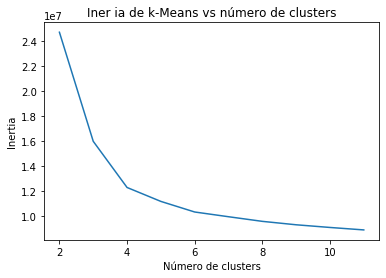

In [36]:
# Prueba: para elegir el hiperparámetro n_clusters, variando de 2 a 11 clusters
scores = [KMeans(n_clusters=i+2).fit(df_skills).inertia_ for i in range(10)]

from matplotlib import pyplot as plt
plt.plot(np.arange(2, 12), scores)
plt.xlabel('Número de clusters')
plt.ylabel("Inertia")
plt.title("Iner ia de k-Means vs número de clusters")

In [37]:
# Guardamos las etiquesta delos clusters en el dataset df_skills
df_skills['Clusters'] = clusters_km
# Podemos graficar todas las relaciones entre 2 variables
# sns.pairplot(df_skills, hue='Clusters')

**Graficamos el resultado kmedias con la cantidad de clases elegida: Visualizamos de a dos variables por vez**


Calculamos las medias de cada variable en cada uno de los clusters y selecciono las 2 habilidades que maximicen la distancia mínima entre las 6 distancias posibles (Obs: Luego de analizarlas quito las variables de goalkeeping).

In [38]:
means = []

for i in list(range(0,n_clust)):
    tmp = df_skills[df_skills['Clusters']==i].drop(columns='Clusters')
    mean = tmp.mean().to_numpy()
    means.append(mean)
    
means = np.array(means)
c=28 # Selecciono las habilidades que no son de arqueros

v1, v2 = 0, 0
dist_old = 0
for j in list(range(c-1)):
    for k in list(range(j+1,c)):
        # distintas opciones de medidas que podemos tomar
        dist = np.min(np.abs(means[:,j]-means[:,k]))
        # dist = np.linalg.norm((means[:,j]-means[:,k]))
        if dist > dist_old:
            v1, v2 = j, k
            dist_old =dist
print(v1,v2)            
sk1 = df_skills.columns[v1]
sk2 = df_skills.columns[v2]


1 20


Si ejecuta en Colab el gráfico será descragado a su computadora

In [39]:
data=[]
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86

# Eligo dos habilidades
skill_1=sk1
skill_2=sk2

# Ploteo de de los jugadores por clusters en puntos
kmean_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],name='Clusters',
                           mode='markers',
                           text=df_n.loc[:,'main_position'],
                           marker=dict(
                                size=10,
                                color = clusters_km.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )
# Ploteo de los jugadores por posiciones en cruces
players_positions = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],name='Posiciones',
                           mode='markers',
                           text=df_n.loc[:,'position'],
                           marker=dict(
                                size=4,
                                symbol='x',
                                color = df_n['position_color'], #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Cracks!!',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,players_positions,crack]

layout = go.Layout(title="Clustering K means ",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1700,height=1000)

fig = go.Figure(data=data, layout=layout)

if in_colab:
  from google.colab import files
  fig.write_html('plot-grafico-kmeans.html')
  files.download('plot-grafico-kmeans.html')
else:
  iplot(fig)


Creamos un nuevo dataset con las etiquetas obtenidas por K-means.

In [40]:
df_cluster_kmean=df_n.copy()
df_cluster_kmean['group_label'] = km.labels_

Análisis exploratorio de los clusters, usando las clases asignadas por kmeans

- Cantidad de observaciones por Cluster
- Análisis descriptivo separando por Cluster
- Tabla de contingencia alguna categórica vs clusters
- Silohuette?

In [41]:
# Cantidad de observaciones por Cluster
df_cluster_count = df_cluster_kmean.groupby(by=['group_label']).count()[['sofifa_id']]
df_cluster_count.columns = ['observaciones']

print('Tabla de cantidad de observaciones por Cluster:')

df_cluster_count

Tabla de cantidad de observaciones por Cluster:


,observaciones
group_label,
0,959
1,440
2,1644
3,1713


In [42]:
# Analisis descriptivo por Cluster
def analisis_cluster(cluster_num):
  print( 'Descripción del cluster', cluster_num )
  df_cluster_km = df_cluster_kmean[df_cluster_kmean.group_label == cluster_num]
  display(df_cluster_km[skills_ratings].describe())
  print('\n __________________________________________________ \n')
  print('Tabla de conteo de posiciones en este cluster: ')
  display(df_cluster_km['main_position'].value_counts())
  print('\n __________________________________________________ \n')

In [43]:
for i in list(range(0,n_clust)):
  analisis_cluster(i)

Descripción del cluster 0


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000,959.000000
mean,47.684046,35.041710,72.452555,66.511992,34.981230,53.881126,41.725756,37.061522,62.109489,62.838373,58.147028,60.810219,55.796663,69.883212,54.873827,56.900938,73.055266,68.761210,79.182482,40.555787,75.811262,73.629823,41.020855,49.014599,44.353493,67.615224,73.470282,75.296142,73.023983,10.628780,10.838373,10.730970,10.807091,10.657977
std,13.901205,9.671339,6.879487,6.521813,10.109405,10.348038,11.805968,11.712785,8.355833,6.959467,12.314946,12.687321,11.585002,5.096452,11.853302,11.743856,11.289975,10.347829,6.993366,13.064269,7.080719,4.733348,12.029868,11.480663,10.545219,6.684121,4.886702,4.256384,4.666145,3.448373,3.325417,3.641071,3.508610,3.281156
min,11.000000,13.000000,40.000000,44.000000,11.000000,22.000000,13.000000,10.000000,25.000000,34.000000,28.000000,29.000000,26.000000,55.000000,26.000000,15.000000,30.000000,29.000000,54.000000,12.000000,39.000000,61.000000,12.000000,13.000000,13.000000,32.000000,62.000000,63.000000,57.000000,3.000000,3.000000,2.000000,3.000000,3.000000
25%,37.000000,28.000000,69.000000,63.000000,28.000000,47.000000,33.000000,29.000000,57.000000,58.000000,51.000000,53.000000,49.000000,67.000000,47.000000,48.500000,68.000000,64.000000,75.000000,30.000000,71.000000,70.000000,31.000000,41.000000,37.000000,64.000000,70.000000,72.000000,70.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,47.000000,35.000000,73.000000,67.000000,34.000000,55.000000,41.000000,35.000000,63.000000,63.000000,61.000000,63.000000,57.000000,70.000000,57.000000,57.000000,75.000000,69.000000,79.000000,40.000000,76.000000,73.000000,40.000000,50.000000,44.000000,68.000000,73.000000,75.000000,73.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,58.000000,42.000000,77.000000,71.000000,42.000000,62.000000,50.000000,43.000000,68.000000,68.000000,67.000000,69.000000,64.000000,73.000000,64.000000,65.000000,80.000000,75.000000,84.000000,51.000000,81.000000,77.000000,50.000000,58.000000,50.000000,72.000000,76.000000,78.000000,76.000000,13.000000,13.000000,13.000000,13.500000,13.000000
max,78.000000,60.000000,90.000000,82.000000,72.000000,77.000000,78.000000,79.000000,83.000000,80.000000,91.000000,92.000000,90.000000,86.000000,91.000000,89.000000,94.000000,93.000000,95.000000,78.000000,95.000000,88.000000,70.000000,75.000000,79.000000,86.000000,94.000000,91.000000,89.000000,58.000000,40.000000,64.000000,56.000000,43.000000



 __________________________________________________ 

Tabla de conteo de posiciones en este cluster: 


CB     780
CDM     93
RB      48
LB      30
RWB      3
LWB      3
CM       2
ST       0
RW       0
RM       0
LW       0
LM       0
GK       0
CF       0
CAM      0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 1


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000,440.000000
mean,14.945455,13.175000,14.909091,30.352273,13.706818,15.400000,15.740909,15.034091,29.470455,22.768182,44.488636,44.452273,46.302273,71.136364,44.947727,52.845455,64.925000,33.927273,65.977273,13.956818,29.429545,19.715909,12.756818,46.470455,22.175000,53.890909,16.902273,14.579545,14.352273,75.765909,72.715909,70.279545,74.331818,77.222727
std,4.477402,3.302351,4.320941,8.677780,3.371183,4.273028,5.188138,5.052907,9.659536,6.481154,9.170611,8.970846,11.994570,5.449670,10.336458,4.827666,9.998237,6.619099,9.627903,3.294981,7.893052,4.950665,3.500400,12.653937,7.252605,11.487416,4.845870,3.373222,3.255413,4.509895,4.729948,6.407324,4.664496,4.709844
min,6.000000,5.000000,7.000000,11.000000,5.000000,7.000000,6.000000,4.000000,9.000000,5.000000,15.000000,16.000000,14.000000,55.000000,20.000000,32.000000,32.000000,13.000000,26.000000,5.000000,11.000000,7.000000,3.000000,10.000000,9.000000,17.000000,7.000000,7.000000,8.000000,61.000000,61.000000,43.000000,62.000000,66.000000
25%,12.000000,11.000000,12.000000,25.000000,11.000000,12.000000,12.000000,12.000000,22.000000,19.000000,38.000000,38.000000,37.000000,68.000000,38.000000,50.000000,60.000000,30.000000,60.000000,12.000000,23.000000,16.000000,11.000000,39.000000,18.000000,49.750000,13.000000,12.000000,12.000000,72.750000,69.000000,66.000000,71.000000,74.000000
50%,14.000000,13.000000,14.000000,30.000000,13.000000,15.000000,15.000000,14.000000,28.000000,22.000000,45.000000,45.000000,45.000000,71.000000,45.000000,53.000000,67.000000,34.000000,68.000000,14.000000,29.000000,20.000000,13.000000,46.000000,22.000000,57.000000,16.000000,14.000000,14.000000,75.000000,72.000000,70.000000,74.000000,77.000000
75%,18.000000,15.000000,17.000000,35.000000,16.000000,18.000000,18.000000,17.000000,35.000000,25.250000,50.000000,50.000000,56.000000,74.000000,52.250000,56.000000,72.000000,40.000000,72.000000,16.000000,36.000000,23.000000,15.000000,55.000000,25.000000,62.000000,20.000000,17.000000,16.000000,79.000000,75.000000,75.000000,77.000000,80.000000
max,35.000000,27.000000,47.000000,61.000000,26.000000,30.000000,69.000000,74.000000,63.000000,46.000000,65.000000,65.000000,71.000000,88.000000,69.000000,70.000000,85.000000,45.000000,85.000000,21.000000,45.000000,30.000000,27.000000,72.000000,54.000000,71.000000,29.000000,24.000000,25.000000,90.000000,92.000000,93.000000,91.000000,92.000000



 __________________________________________________ 

Tabla de conteo de posiciones en este cluster: 


GK     440
ST       0
RWB      0
RW       0
RM       0
RB       0
LWB      0
LW       0
LM       0
LB       0
CM       0
CF       0
CDM      0
CB       0
CAM      0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 2


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000,1644.000000
mean,64.602190,72.194039,61.240268,70.669100,66.914842,75.181873,67.130779,60.102798,60.655718,75.231752,75.922749,75.535280,76.000608,71.785888,71.723844,74.204988,66.877129,69.956813,66.339416,68.982360,57.624088,34.628954,73.829684,68.530414,67.113747,71.282847,36.609489,33.782847,29.780414,10.577859,10.627737,10.645377,10.524939,10.492092
std,11.279275,6.277567,13.733887,5.909543,8.690390,6.030084,10.788592,13.794148,10.713702,5.121809,10.765615,10.179011,10.321992,5.947254,12.318966,6.470210,12.880016,8.839474,13.395310,7.212052,13.774015,11.094286,5.869151,8.168101,8.531911,6.792977,11.769321,11.051461,10.267266,3.133569,3.098915,3.156716,3.149740,3.214856
min,25.000000,44.000000,20.000000,52.000000,32.000000,53.000000,26.000000,22.000000,21.000000,57.000000,28.000000,30.000000,32.000000,54.000000,29.000000,39.000000,29.000000,30.000000,27.000000,40.000000,22.000000,10.000000,53.000000,38.000000,31.000000,47.000000,10.000000,10.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,59.000000,68.000000,50.000000,67.000000,62.000000,71.000000,61.000000,50.000000,55.000000,72.000000,70.000000,70.000000,71.000000,68.000000,66.000000,70.000000,60.000000,65.000000,59.000000,65.000000,47.750000,26.000000,70.000000,64.000000,62.000000,67.000000,28.000000,25.000000,22.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,67.000000,72.000000,63.000000,70.500000,68.000000,75.000000,68.000000,62.000000,62.000000,75.000000,77.000000,76.000000,77.000000,71.000000,73.000000,75.000000,68.000000,71.000000,67.000000,69.000000,58.000000,34.000000,73.000000,69.000000,68.000000,71.000000,36.000000,33.000000,28.000000,11.000000,11.000000,11.000000,10.000000,10.000000
75%,72.000000,76.000000,73.000000,74.000000,73.000000,79.000000,75.000000,71.000000,68.000000,78.000000,83.000000,83.000000,83.000000,75.000000,80.000000,78.000000,75.000000,76.000000,76.000000,73.000000,68.000000,42.000000,77.000000,74.000000,73.000000,76.000000,45.000000,41.000000,37.000000,13.000000,13.000000,13.000000,13.000000,13.000000
max,91.000000,95.000000,93.000000,92.000000,90.000000,97.000000,94.000000,94.000000,92.000000,96.000000,97.000000,96.000000,96.000000,96.000000,96.000000,95.000000,95.000000,93.000000,95.000000,94.000000,93.000000,66.000000,95.000000,94.000000,92.000000,96.000000,73.000000,66.000000,62.000000,27.000000,25.000000,31.000000,33.000000,37.000000



 __________________________________________________ 

Tabla de conteo de posiciones en este cluster: 


ST     714
CAM    267
LM     218
RM     185
RW     103
LW     103
CF      38
CM      16
RWB      0
RB       0
LWB      0
LB       0
GK       0
CDM      0
CB       0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 3


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000,1714.000000
mean,69.221120,57.795216,61.889148,75.100933,56.557760,72.302800,66.795216,59.702450,71.273046,74.689615,70.429988,69.822054,71.925321,73.124854,70.991249,71.679697,68.796383,77.634772,69.039090,65.745624,72.457410,70.753792,66.365811,69.485414,58.854142,72.294049,68.696616,71.314469,68.477246,10.687865,10.711785,10.848891,10.763711,10.694282
std,8.354912,10.517745,9.920729,5.041888,11.677531,6.057992,10.099133,13.011339,6.685418,4.922925,10.464130,11.081261,8.309204,5.157489,9.795840,8.191846,10.787496,8.801282,9.048626,9.870885,9.023074,7.095714,7.612309,8.115704,10.859436,6.460071,8.173907,6.899305,8.421874,4.257201,4.112091,4.017174,4.276581,4.001591
min,40.000000,20.000000,22.000000,58.000000,21.000000,43.000000,31.000000,22.000000,32.000000,55.000000,30.000000,29.000000,33.000000,56.000000,32.000000,34.000000,30.000000,33.000000,29.000000,26.000000,34.000000,44.000000,30.000000,39.000000,25.000000,51.000000,25.000000,44.000000,36.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,64.000000,51.000000,56.000000,72.000000,49.000000,69.000000,61.000000,50.000000,68.000000,72.000000,65.000000,64.000000,67.000000,70.000000,65.000000,67.000000,63.000000,73.000000,64.000000,60.000000,67.000000,67.000000,62.000000,65.000000,51.000000,68.000000,65.000000,68.000000,64.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,70.000000,59.000000,62.000000,75.000000,57.000000,72.000000,68.000000,61.000000,72.000000,74.000000,71.000000,71.000000,72.000000,73.000000,72.000000,73.000000,70.000000,78.000000,69.000000,67.000000,73.000000,71.000000,67.000000,70.000000,59.000000,72.000000,70.000000,72.000000,70.000000,11.000000,11.000000,11.000000,11.000000,10.500000
75%,75.000000,66.000000,69.000000,78.000000,65.000000,76.000000,74.000000,70.000000,75.000000,77.000000,77.000000,77.000000,77.000000,76.000000,77.000000,77.000000,76.000000,84.000000,75.000000,73.000000,79.000000,75.000000,72.000000,75.000000,66.000000,76.000000,74.000000,76.000000,74.000000,13.000000,13.000000,13.000000,13.000000,13.000000
max,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000,99.000000



 __________________________________________________ 

Tabla de conteo de posiciones en este cluster: 


CM     534
CDM    334
RB     253
LB     239
CAM     93
CB      86
RM      66
LM      51
LWB     16
RWB     13
RW      11
ST       7
LW       6
CF       5
GK       0
Name: main_position, dtype: int64


 __________________________________________________ 



In [44]:
# Tablas de contingencia main_position vs clusters y position vs clusters
for i in list(range(0,n_clust)):
  df_cluster_kmean['group_label'] = df_cluster_kmean['group_label'].replace(i,'cluster_'+str(i))

display(pd.crosstab(index=df_cluster_kmean['main_position'],columns=df_cluster_kmean['group_label']))
print('\n __________________________________________________ \n')
pd.crosstab(index=df_cluster_kmean['position'],columns=df_cluster_kmean['group_label'])

group_label,cluster_0,cluster_1,cluster_2,cluster_3
main_position,,,,
CAM,0,0,267,93
CB,780,0,0,86
CDM,93,0,0,334
CF,0,0,38,5
CM,2,0,16,534
GK,0,440,0,0
LB,30,0,0,239
LM,0,0,218,51
LW,0,0,103,6



 __________________________________________________ 



group_label,cluster_0,cluster_1,cluster_2,cluster_3
position,,,,
Defender,864,0,0,607
Forward,0,0,958,29
GK,0,440,0,0
Midfielder,95,0,686,1078


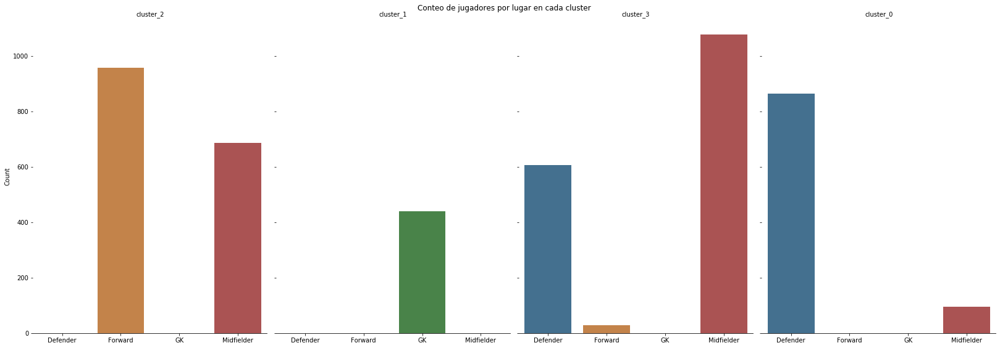

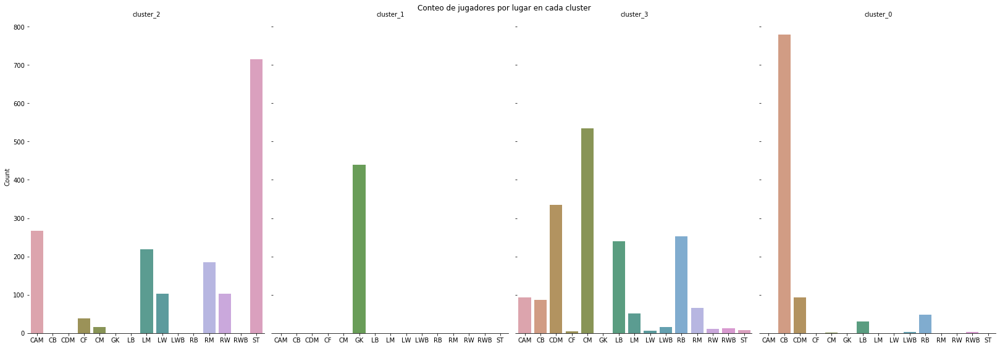

In [45]:
# Gráfico de las cantidad de jugadores por posiciones discriminados por lugar en cancha
g = sns.catplot(x="position", col="group_label",
                data=df_cluster_kmean, saturation=.5,
                kind="count", ci=None, height=8, aspect=0.7)
g.fig.suptitle('Conteo de jugadores por lugar en cada cluster', y=1)
(g.set_axis_labels("", "Count").set_titles("{col_name}").despine(left=True)) 

# Gráfico de las cantidad de jugadores discriminados por posición
g = sns.catplot(x="main_position", col="group_label",
                data=df_cluster_kmean, saturation=.5,
                kind="count", ci=None, height=8, aspect=0.7)
g.fig.suptitle('Conteo de jugadores por lugar en cada cluster', y=1)
(g.set_axis_labels("", "Count").set_titles("{col_name}").despine(left=True)) 


Automatically created module for IPython interactive environment
Para n_clusters = 4 El silhouette_score promedio es : 0.32868387703335106


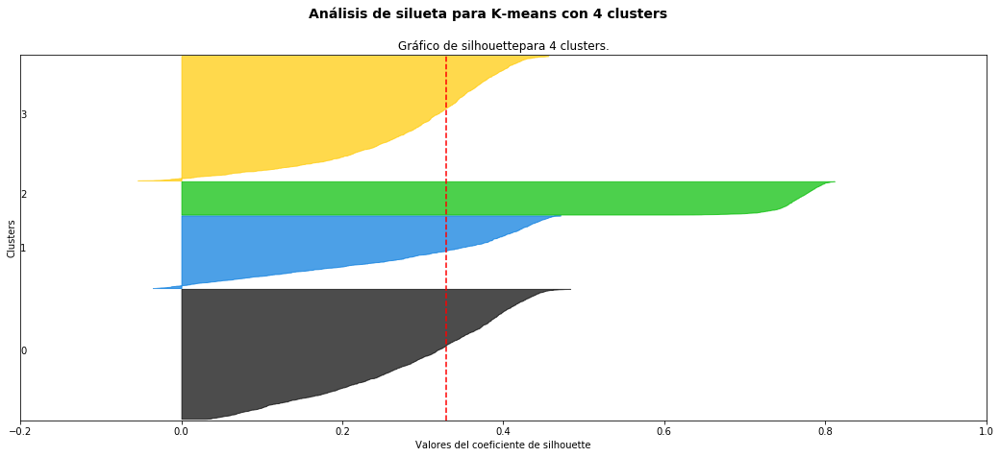

In [46]:
print(__doc__)

X = df_skills

range_n_clusters = [4]

for n_clusters in range_n_clusters:
    fig, ax1 = plt.subplots(1, 1)
    fig.set_size_inches(18, 7)

    # Fijo limites del gráfico entre -0.2 y 1
    ax1.set_xlim([-0.2, 1])
    ax1.set_ylim([-10, len(X) + (n_clusters + 1) * 10])

    # Calculo los cluster
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # El silhouette_score es el promedio de todos los ejemplos.
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("Para n_clusters =", n_clusters,
          "El silhouette_score promedio es :", silhouette_avg)

    # Calcular la silhouette
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):

        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Agrego la etiqueta del cluster
        ax1.text(-0.2, y_lower + 0.5 * size_cluster_i, str(i))

        # nuevo y_lower para próximo plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("Gráfico de silhouettepara 4 clusters.")
    ax1.set_xlabel("Valores del coeficiente de silhouette")
    ax1.set_ylabel("Clusters")

    # Línea vertical para el puntaje promedio
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([]) 
    ax1.set_xticks([-0.2, 0, 0.2, 0.4, 0.6, 0.8, 1])

    plt.suptitle(("Análisis de silueta para K-means con 4 clusters"),
                 fontsize=14, fontweight='bold')

plt.show()

Observamos algunos valores negativos y como la silhouette celeste del cluster de arqueros esta representado de una forma mas definida.

# 5.-Clustering-con-Mean-Shift 

- Hipeparámetros: radio (de cobertura para cálculo de media)

In [47]:

df_skills = df_n[skills_ratings]
X=df_skills # Datos para proyectar

# Posibles maneras de escalar los datos
# std_scale=preprocessing.MinMaxScaler().fit(X)
# X=std_scale.transform(X) # numpyarray normalizado por columna
# std_scale=preprocessing.StandardScaler().fit(X)
# X=std_scale.transform(X) # numpyarray normalizado por columna
# std_scale=preprocessing.RobustScaler().fit(X)
# X=std_scale.transform(X) # numpyarray normalizado por columna

Ancho de vanda estimado: 62.15965034125524
Numero estimado de clusters para Mean Shift : 9
Midfielder    1099
Defender      1024
Forward         20
GK               0
Name: position, dtype: int64
Forward       966
Midfielder    758
GK              0
Defender        0
Name: position, dtype: int64
GK            439
Midfielder      0
Forward         0
Defender        0
Name: position, dtype: int64
Forward       1
Midfielder    0
GK            0
Defender      0
Name: position, dtype: int64
Defender      1
Midfielder    0
GK            0
Forward       0
Name: position, dtype: int64
Defender      443
Midfielder      2
GK              0
Forward         0
Name: position, dtype: int64
Defender      1
Midfielder    0
GK            0
Forward       0
Name: position, dtype: int64
Defender      2
Midfielder    0
GK            0
Forward       0
Name: position, dtype: int64
GK            1
Midfielder    0
Forward       0
Defender      0
Name: position, dtype: int64


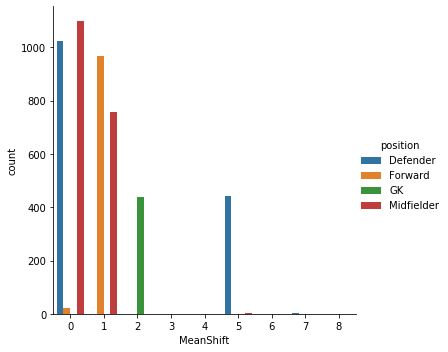

In [48]:
bandwidth = estimate_bandwidth(X, quantile=0.09)
print('Ancho de vanda estimado:', bandwidth)
ms = MeanShift(bandwidth=bandwidth, n_jobs=-1)
ms.fit(X)

clusters_ms = ms.labels_
cluster_centers = ms.cluster_centers_

labels_unique = np.unique(clusters_ms)
n_clusters_ms = len(labels_unique)

print("Numero estimado de clusters para Mean Shift : %d" % n_clusters_ms)

df_clusters_mshift=df_n.copy()
df_clusters_mshift['MeanShift'] = ms.labels_

for i in list(range(0,n_clusters_ms)):
  print(df_clusters_mshift[df_clusters_mshift['MeanShift']==i]['position'].value_counts())
  
df_clusters_mshift['MeanShift'] = df_clusters_mshift['MeanShift'].astype(str)
ax =sns.catplot(x='MeanShift', hue='position', kind='count',data=df_clusters_mshift)

In [49]:
df_skills['Clusters'] = clusters_ms

In [50]:
means = []

for i in list(range(0,n_clusters_ms)):
    tmp = df_skills[df_skills['Clusters']==i].drop(columns='Clusters')
    mean = tmp.mean().to_numpy()
    means.append(mean)
    
means = np.array(means)
c=28 # Selecciono las habilidades que no son de arqueros

v1, v2 = 0, 0
dist_old = 0
for j in list(range(c-1)):
    for k in list(range(j+1,c)):
        # distintas opciones de medidas que podemos tomar
        # dist = np.min(np.abs(means[:,j]-means[:,k]))
        dist = np.linalg.norm((means[:,j]-means[:,k]))
        if dist > dist_old:
            v1, v2 = j, k
            dist_old =dist
print(v1,v2)            
sk1 = df_skills.columns[v1]
sk2 = df_skills.columns[v2]

1 13


In [51]:

data=[]
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86


#Eligo dos números entre 0 y  de n_skills-1
skill_1=sk1
skill_2=sk2


MeanShift_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'position'],
                           marker=dict(
                                size=10,
                                color = clusters_ms.astype(np.float), #set color equal to a variable
                                colorscale='deep',
                                showscale=False)
                           )
players_positions = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                           text=df_n.loc[:,'position'],
                           marker=dict(
                                size=3,
                                symbol='x',
                                color = df_n['position_color'], #set color equal to a variable
                                colorscale='jet',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[MeanShift_clusters,players_positions,crack]
# data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1700,height=1000)

fig = go.Figure(data=data, layout=layout)

if in_colab:
  from google.colab import files
  fig.write_html('plot-grafico-mean-shift.html')
  files.download('plot-grafico-mean-shift.html')
else:
  iplot(fig)

In [52]:
df_cluster_mshift=df_n.copy()
df_cluster_mshift['group_label'] = ms.labels_ #clusters

In [53]:
# Cantidad de observaciones por Cluster
df_cluster_count = df_cluster_mshift.groupby(by=['group_label']).count()[['sofifa_id']]
df_cluster_count.columns = ['observaciones']

print('Tabla de cantidad de observaciones por Cluster:')

df_cluster_count

Tabla de cantidad de observaciones por Cluster:


,observaciones
group_label,
0,2143
1,1724
2,439
3,0
4,1
5,445
6,1
7,2
8,1


In [54]:
# Analisis descriptivo por Cluster
def analisis_cluster(cluster_num):
  print( 'Descripción del cluster', cluster_num )
  df_cluster_ms = df_cluster_mshift[df_cluster_mshift.group_label == cluster_num]
  display(df_cluster_ms[skills_ratings].describe())
  print('\n __________________________________________________ \n')
  print('Tabla de conteo y grafico de posiciones en este cluster: ')
  display(df_cluster_ms['main_position'].value_counts())
  print('\n __________________________________________________ \n')

In [55]:
for i in list(range(0,n_clusters_ms)):
  analisis_cluster(i)

Descripción del cluster 0


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.00000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000,2143.000000
mean,65.636491,52.904806,64.271582,73.636024,51.816612,69.094260,61.80308,54.865142,69.757816,72.562296,68.567895,68.716286,69.129258,72.514699,67.948203,68.726552,70.320579,76.693420,71.248717,60.781148,73.629958,71.942137,61.625292,65.820345,55.609426,71.337844,70.336444,72.777881,70.251517,10.535231,10.661689,10.747550,10.681755,10.575828
std,11.130661,12.710241,10.020985,5.638838,13.477251,8.169452,13.06364,14.878155,7.201946,6.035277,10.752453,11.115250,9.316541,5.209938,11.060129,10.178926,10.724780,8.804696,8.936398,13.269461,8.426747,6.209869,11.539566,10.214914,11.826557,6.664334,7.147781,6.025478,7.279130,3.097022,3.120198,3.152106,3.166037,3.128394
min,22.000000,18.000000,22.000000,49.000000,11.000000,33.000000,21.00000,16.000000,30.000000,48.000000,30.000000,29.000000,30.000000,55.000000,29.000000,25.000000,30.000000,33.000000,29.000000,13.000000,36.000000,44.000000,20.000000,27.000000,20.000000,38.000000,25.000000,48.000000,36.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,60.000000,43.000000,58.000000,70.000000,42.000000,65.000000,54.00000,43.000000,66.000000,69.000000,63.000000,63.000000,64.000000,69.000000,62.000000,63.000000,64.000000,71.000000,66.000000,53.000000,69.000000,68.000000,55.000000,59.000000,47.000000,67.000000,67.000000,70.000000,67.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,68.000000,54.000000,65.000000,74.000000,53.000000,70.000000,64.00000,55.000000,70.000000,73.000000,69.000000,69.000000,69.000000,72.000000,69.000000,70.000000,71.000000,77.000000,72.000000,64.000000,74.000000,72.000000,64.000000,67.000000,56.000000,71.000000,71.000000,73.000000,71.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,73.500000,63.000000,71.000000,77.000000,62.000000,75.000000,72.00000,67.000000,74.000000,76.000000,76.000000,76.000000,76.000000,76.000000,76.000000,76.000000,77.000000,83.000000,77.000000,71.000000,80.000000,76.000000,70.000000,73.000000,64.000000,76.000000,75.000000,76.000000,75.000000,13.000000,13.000000,13.000000,13.000000,13.000000
max,91.000000,85.000000,92.000000,92.000000,87.000000,90.000000,91.00000,92.000000,92.000000,92.000000,94.000000,94.000000,93.000000,93.000000,94.000000,95.000000,94.000000,97.000000,93.000000,88.000000,95.000000,92.000000,90.000000,91.000000,91.000000,95.000000,94.000000,92.000000,90.000000,22.000000,22.000000,28.000000,24.000000,23.000000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


CM     520
CDM    425
CB     421
RB     299
LB     269
CAM     65
RM      48
LM      41
LWB     19
RWB     16
ST       7
RW       7
LW       4
CF       2
GK       0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 1


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000,1724.000000
mean,65.009861,71.988399,60.908933,70.933875,66.869490,75.316125,67.504060,60.480858,61.152552,75.378190,75.951856,75.474478,76.188515,71.850928,71.988399,74.218097,66.687935,70.102668,66.062645,69.121810,57.790023,35.696636,73.729698,68.860789,67.035383,71.390951,37.404292,34.876450,30.785963,10.593968,10.643271,10.645012,10.503480,10.507541
std,11.249836,6.370081,13.653806,6.004760,8.687441,6.023012,10.799577,13.765223,10.808331,5.168626,10.674279,10.146686,10.227128,5.962871,12.219832,6.512188,12.880317,8.846299,13.340995,7.234021,13.633329,11.927726,5.904249,8.224526,8.578301,6.826789,12.167748,11.905282,11.057755,3.142188,3.096589,3.138397,3.163835,3.199400
min,25.000000,44.000000,20.000000,52.000000,32.000000,53.000000,26.000000,22.000000,21.000000,57.000000,28.000000,30.000000,32.000000,54.000000,29.000000,39.000000,29.000000,30.000000,27.000000,40.000000,22.000000,10.000000,53.000000,38.000000,31.000000,47.000000,10.000000,10.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,60.000000,68.000000,50.000000,67.000000,62.000000,72.000000,61.000000,51.000000,55.000000,72.000000,70.000000,70.000000,71.000000,68.000000,66.000000,70.000000,59.000000,66.000000,58.000000,65.000000,48.000000,26.000000,70.000000,64.000000,62.000000,67.000000,28.000000,25.000000,22.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,67.000000,72.000000,62.000000,71.000000,68.000000,75.000000,68.000000,63.000000,63.000000,75.000000,77.000000,76.000000,77.000000,71.000000,73.000000,75.000000,68.000000,71.000000,67.000000,69.000000,58.000000,35.000000,73.000000,70.000000,68.000000,71.000000,36.000000,34.000000,29.000000,11.000000,11.000000,11.000000,10.000000,10.000000
75%,72.000000,76.000000,72.000000,75.000000,73.000000,79.000000,75.000000,71.000000,69.000000,78.000000,83.000000,83.000000,83.000000,75.000000,80.000000,78.000000,75.000000,76.000000,75.000000,74.000000,68.000000,44.000000,77.000000,74.000000,73.000000,76.000000,46.000000,43.000000,38.000000,13.000000,13.000000,13.000000,13.000000,13.000000
max,93.000000,95.000000,93.000000,92.000000,90.000000,97.000000,94.000000,94.000000,92.000000,96.000000,97.000000,96.000000,96.000000,96.000000,96.000000,95.000000,95.000000,93.000000,95.000000,94.000000,93.000000,69.000000,95.000000,94.000000,92.000000,96.000000,73.000000,67.000000,63.000000,27.000000,25.000000,31.000000,33.000000,37.000000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


ST     714
CAM    295
LM     228
RM     203
RW     106
LW     105
CF      41
CM      32
RWB      0
RB       0
LWB      0
LB       0
GK       0
CDM      0
CB       0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 2


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.00000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000,439.000000
mean,14.952164,13.186788,14.911162,30.396355,13.710706,15.419134,15.619590,14.899772,29.489749,22.765376,44.496583,44.469248,46.305239,71.14123,44.933941,52.842825,64.915718,33.940774,65.990888,13.968109,29.428246,19.710706,12.753986,46.457859,22.170843,53.881549,16.881549,14.592255,14.364465,75.776765,72.722096,70.275626,74.334852,77.227790
std,4.480296,3.296838,4.325652,8.638217,3.374041,4.258990,4.526298,4.199258,9.662064,6.488281,9.179557,8.974003,12.008093,5.45493,10.344200,4.832858,10.007746,6.620582,9.634646,3.290207,7.902010,4.955109,3.503889,12.665613,7.260355,11.498843,4.831839,3.366506,3.249055,4.509281,4.733562,6.414106,4.669384,4.714018
min,6.000000,5.000000,7.000000,11.000000,5.000000,7.000000,6.000000,4.000000,9.000000,5.000000,15.000000,16.000000,14.000000,55.00000,20.000000,32.000000,32.000000,13.000000,26.000000,5.000000,11.000000,7.000000,3.000000,10.000000,9.000000,17.000000,7.000000,7.000000,8.000000,61.000000,61.000000,43.000000,62.000000,66.000000
25%,12.000000,11.000000,12.000000,25.000000,11.000000,12.000000,12.000000,12.000000,22.000000,19.000000,38.000000,38.000000,37.000000,68.00000,38.000000,50.000000,60.000000,30.000000,60.000000,12.000000,23.000000,16.000000,11.000000,39.000000,18.000000,49.500000,13.000000,12.000000,12.000000,73.000000,69.000000,66.000000,71.000000,74.000000
50%,14.000000,13.000000,14.000000,30.000000,13.000000,15.000000,15.000000,14.000000,28.000000,22.000000,45.000000,45.000000,45.000000,71.00000,45.000000,53.000000,67.000000,34.000000,68.000000,14.000000,29.000000,20.000000,13.000000,46.000000,22.000000,57.000000,16.000000,14.000000,14.000000,75.000000,72.000000,70.000000,74.000000,77.000000
75%,18.000000,15.000000,17.000000,35.000000,16.000000,18.000000,18.000000,17.000000,35.000000,25.500000,50.000000,50.000000,56.000000,74.00000,52.500000,56.000000,72.000000,40.000000,72.000000,16.000000,36.000000,23.000000,15.000000,55.000000,25.000000,62.000000,20.000000,17.000000,16.000000,79.000000,75.000000,75.000000,77.000000,80.000000
max,35.000000,27.000000,47.000000,61.000000,26.000000,30.000000,34.000000,40.000000,63.000000,46.000000,65.000000,65.000000,71.000000,88.00000,69.000000,70.000000,85.000000,45.000000,85.000000,21.000000,45.000000,30.000000,27.000000,72.000000,54.000000,71.000000,29.000000,24.000000,25.000000,90.000000,92.000000,93.000000,91.000000,92.000000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


GK     439
ST       0
RWB      0
RW       0
RM       0
RB       0
LWB      0
LW       0
LM       0
LB       0
CM       0
CF       0
CDM      0
CB       0
CAM      0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 3


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
25%,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
50%,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
75%,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0
max,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0,99.0



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


RW     1
ST     0
RWB    0
RM     0
RB     0
LWB    0
LW     0
LM     0
LB     0
GK     0
CM     0
CF     0
CDM    0
CB     0
CAM    0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 4


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0
25%,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0
50%,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0
75%,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0
max,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


RB     1
ST     0
RWB    0
RW     0
RM     0
LWB    0
LW     0
LM     0
LB     0
GK     0
CM     0
CF     0
CDM    0
CB     0
CAM    0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 5


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000,445.000000
mean,39.458427,30.570787,74.352809,63.426966,31.231461,47.049438,35.377528,32.743820,58.811236,58.725843,51.694382,54.800000,49.110112,68.937079,49.732584,53.638202,71.595506,63.851685,81.707865,34.379775,75.934831,73.424719,33.743820,42.076404,42.071910,66.539326,73.579775,75.193258,72.613483,10.703371,10.716854,10.642697,10.822472,10.728090
std,10.968883,8.699568,4.685998,6.439055,9.332347,8.979320,9.409667,10.227017,8.716266,6.262744,11.249268,12.103458,10.802444,4.703420,11.164735,11.974330,12.292896,10.621266,6.095712,11.555664,6.505561,4.561079,9.235263,9.947090,10.531345,6.371842,4.389899,3.949963,4.199292,3.202211,3.316056,3.354501,3.275962,3.250121
min,11.000000,13.000000,58.000000,44.000000,13.000000,22.000000,13.000000,13.000000,25.000000,34.000000,28.000000,29.000000,26.000000,57.000000,26.000000,15.000000,30.000000,29.000000,64.000000,12.000000,45.000000,61.000000,12.000000,13.000000,13.000000,32.000000,63.000000,64.000000,61.000000,3.000000,3.000000,3.000000,3.000000,3.000000
25%,32.000000,24.000000,71.000000,59.000000,25.000000,42.000000,29.000000,26.000000,54.000000,55.000000,44.000000,47.000000,40.000000,66.000000,41.000000,45.000000,67.000000,58.000000,77.000000,26.000000,72.000000,70.000000,27.000000,34.000000,35.000000,63.000000,70.000000,72.000000,70.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,38.000000,30.000000,74.000000,64.000000,30.000000,47.000000,34.000000,31.000000,60.000000,59.000000,53.000000,55.000000,51.000000,69.000000,51.000000,53.000000,74.000000,65.000000,82.000000,32.000000,76.000000,73.000000,32.000000,42.000000,41.000000,67.000000,73.000000,75.000000,72.000000,11.000000,11.000000,11.000000,10.000000,11.000000
75%,46.000000,36.000000,77.000000,68.000000,36.000000,53.000000,40.000000,37.000000,65.000000,63.000000,61.000000,64.000000,57.000000,72.000000,58.000000,62.000000,79.000000,71.000000,86.000000,41.000000,80.000000,77.000000,39.000000,49.000000,47.000000,71.000000,76.000000,77.000000,75.000000,13.000000,13.000000,13.000000,14.000000,13.000000
max,70.000000,60.000000,90.000000,78.000000,62.000000,69.000000,69.000000,69.000000,80.000000,73.000000,79.000000,87.000000,75.000000,86.000000,79.000000,85.000000,94.000000,93.000000,95.000000,71.000000,92.000000,88.000000,67.000000,66.000000,79.000000,82.000000,91.000000,90.000000,87.000000,32.000000,33.000000,38.000000,32.000000,34.000000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


CB     442
CDM      2
RB       1
ST       0
RWB      0
RW       0
RM       0
LWB      0
LW       0
LM       0
LB       0
GK       0
CM       0
CF       0
CAM      0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 6


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0
25%,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0
50%,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0
75%,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0
max,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


CB     1
ST     0
RWB    0
RW     0
RM     0
RB     0
LWB    0
LW     0
LM     0
LB     0
GK     0
CM     0
CF     0
CDM    0
CAM    0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 7


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,2.000000,2.000000,2.00000,2.000000,2.00000,2.000000,2.000000,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.00000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.00000,2.000000,2.000000,2.000000,2.000000,2.00000,2.000000,2.00000
mean,33.500000,31.500000,81.50000,67.000000,30.00000,55.000000,37.500000,29.500000,61.0,68.500000,82.000000,80.500000,72.500000,83.50000,64.000000,46.500000,77.500000,74.000000,77.500000,26.500000,86.0,84.000000,31.500000,32.000000,41.000000,78.000000,85.50000,86.000000,82.500000,33.000000,23.000000,36.00000,35.500000,27.50000
std,9.192388,9.192388,2.12132,9.899495,19.79899,1.414214,10.606602,27.577164,0.0,4.949747,1.414214,3.535534,6.363961,2.12132,5.656854,9.192388,12.020815,2.828427,6.363961,20.506097,0.0,2.828427,9.192388,14.142136,21.213203,9.899495,2.12132,1.414214,9.192388,35.355339,24.041631,39.59798,28.991378,21.92031
min,27.000000,25.000000,80.00000,60.000000,16.00000,54.000000,30.000000,10.000000,61.0,65.000000,81.000000,78.000000,68.000000,82.00000,60.000000,40.000000,69.000000,72.000000,73.000000,12.000000,86.0,82.000000,25.000000,22.000000,26.000000,71.000000,84.00000,85.000000,76.000000,8.000000,6.000000,8.00000,15.000000,12.00000
25%,30.250000,28.250000,80.75000,63.500000,23.00000,54.500000,33.750000,19.750000,61.0,66.750000,81.500000,79.250000,70.250000,82.75000,62.000000,43.250000,73.250000,73.000000,75.250000,19.250000,86.0,83.000000,28.250000,27.000000,33.500000,74.500000,84.75000,85.500000,79.250000,20.500000,14.500000,22.00000,25.250000,19.75000
50%,33.500000,31.500000,81.50000,67.000000,30.00000,55.000000,37.500000,29.500000,61.0,68.500000,82.000000,80.500000,72.500000,83.50000,64.000000,46.500000,77.500000,74.000000,77.500000,26.500000,86.0,84.000000,31.500000,32.000000,41.000000,78.000000,85.50000,86.000000,82.500000,33.000000,23.000000,36.00000,35.500000,27.50000
75%,36.750000,34.750000,82.25000,70.500000,37.00000,55.500000,41.250000,39.250000,61.0,70.250000,82.500000,81.750000,74.750000,84.25000,66.000000,49.750000,81.750000,75.000000,79.750000,33.750000,86.0,85.000000,34.750000,37.000000,48.500000,81.500000,86.25000,86.500000,85.750000,45.500000,31.500000,50.00000,45.750000,35.25000
max,40.000000,38.000000,83.00000,74.000000,44.00000,56.000000,45.000000,49.000000,61.0,72.000000,83.000000,83.000000,77.000000,85.00000,68.000000,53.000000,86.000000,76.000000,82.000000,41.000000,86.0,86.000000,38.000000,42.000000,56.000000,85.000000,87.00000,87.000000,89.000000,58.000000,40.000000,64.00000,56.000000,43.00000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


CB     2
ST     0
RWB    0
RW     0
RM     0
RB     0
LWB    0
LW     0
LM     0
LB     0
GK     0
CM     0
CF     0
CDM    0
CAM    0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 8


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,12.0,8.0,14.0,11.0,12.0,7.0,69.0,74.0,21.0,24.0,41.0,37.0,45.0,69.0,51.0,54.0,69.0,28.0,60.0,9.0,30.0,22.0,14.0,52.0,24.0,58.0,26.0,9.0,9.0,71.0,70.0,72.0,73.0,75.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,12.0,8.0,14.0,11.0,12.0,7.0,69.0,74.0,21.0,24.0,41.0,37.0,45.0,69.0,51.0,54.0,69.0,28.0,60.0,9.0,30.0,22.0,14.0,52.0,24.0,58.0,26.0,9.0,9.0,71.0,70.0,72.0,73.0,75.0
25%,12.0,8.0,14.0,11.0,12.0,7.0,69.0,74.0,21.0,24.0,41.0,37.0,45.0,69.0,51.0,54.0,69.0,28.0,60.0,9.0,30.0,22.0,14.0,52.0,24.0,58.0,26.0,9.0,9.0,71.0,70.0,72.0,73.0,75.0
50%,12.0,8.0,14.0,11.0,12.0,7.0,69.0,74.0,21.0,24.0,41.0,37.0,45.0,69.0,51.0,54.0,69.0,28.0,60.0,9.0,30.0,22.0,14.0,52.0,24.0,58.0,26.0,9.0,9.0,71.0,70.0,72.0,73.0,75.0
75%,12.0,8.0,14.0,11.0,12.0,7.0,69.0,74.0,21.0,24.0,41.0,37.0,45.0,69.0,51.0,54.0,69.0,28.0,60.0,9.0,30.0,22.0,14.0,52.0,24.0,58.0,26.0,9.0,9.0,71.0,70.0,72.0,73.0,75.0
max,12.0,8.0,14.0,11.0,12.0,7.0,69.0,74.0,21.0,24.0,41.0,37.0,45.0,69.0,51.0,54.0,69.0,28.0,60.0,9.0,30.0,22.0,14.0,52.0,24.0,58.0,26.0,9.0,9.0,71.0,70.0,72.0,73.0,75.0



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


GK     1
ST     0
RWB    0
RW     0
RM     0
RB     0
LWB    0
LW     0
LM     0
LB     0
CM     0
CF     0
CDM    0
CB     0
CAM    0
Name: main_position, dtype: int64


 __________________________________________________ 



In [56]:
# Tablas de contingencia main_position vs clusters y position vs clusters
for i in list(range(0,n_clusters_ms)):
  df_cluster_mshift['group_label'] = df_cluster_mshift['group_label'].replace(i,'cluster_'+str(i))

display(pd.crosstab(index=df_cluster_mshift['main_position'],columns=df_cluster_mshift['group_label']))
print('\n __________________________________________________ \n')
pd.crosstab(index=df_cluster_mshift['position'],columns=df_cluster_mshift['group_label'])

group_label,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8
main_position,,,,,,,,,
CAM,65,295,0,0,0,0,0,0,0
CB,421,0,0,0,0,442,1,2,0
CDM,425,0,0,0,0,2,0,0,0
CF,2,41,0,0,0,0,0,0,0
CM,520,32,0,0,0,0,0,0,0
GK,0,0,439,0,0,0,0,0,1
LB,269,0,0,0,0,0,0,0,0
LM,41,228,0,0,0,0,0,0,0
LW,4,105,0,0,0,0,0,0,0



 __________________________________________________ 



group_label,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8
position,,,,,,,,,
Defender,1024,0,0,0,1,443,1,2,0
Forward,20,966,0,1,0,0,0,0,0
GK,0,0,439,0,0,0,0,0,1
Midfielder,1099,758,0,0,0,2,0,0,0


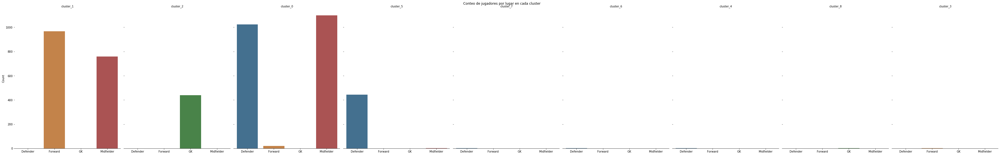

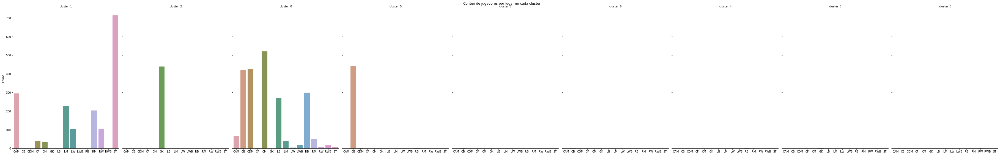

In [57]:
# Gráfico de las cantidad de jugadores por posiciones discriminados por lugar en cancha
g = sns.catplot(x="position", col="group_label",
                data=df_cluster_mshift, saturation=.5,
                kind="count", ci=None, height=8, aspect=0.7)
g.fig.suptitle('Conteo de jugadores por lugar en cada cluster', y=1)
(g.set_axis_labels("", "Count").set_titles("{col_name}").despine(left=True)) 

# Gráfico de las cantidad de jugadores discriminados por posición
g = sns.catplot(x="main_position", col="group_label",
                data=df_cluster_mshift, saturation=.5,
                kind="count", ci=None, height=8, aspect=0.7)
g.fig.suptitle('Conteo de jugadores por lugar en cada cluster', y=1)
(g.set_axis_labels("", "Count").set_titles("{col_name}").despine(left=True)) 

# 6.-Clustering-con-Mean-Shift-sin-Arqueros


In [58]:
df_nngk=df_n[(df_n["main_position"]!='GK')&(df_n['overall']>70)]
df_nngk = df_nngk.head(-1)
df_skills = df_nngk[skills_ratings]
X=df_skills # Datos para proyectar

# print('los datos tienen dimesión n = ',len(skills_ratings))
# std_scale=preprocessing.MinMaxScaler().fit(X)
# X=std_scale.transform(X) # numpyarray normalizado por columna
# std_scale=preprocessing.StandardScaler().fit(X)
# X=std_scale.transform(X) # numpyarray normalizado por columna
# std_scale=preprocessing.RobustScaler().fit(X)
# X=std_scale.transform(X) # numpyarray normalizado por columna

Ancho de vanda estimado: 65.40629292629471
Numero estimado de clusters para Mean Shift : 6
Midfielder    1075
Defender      1035
Forward         18
GK               0
Name: position, dtype: int64
Forward       968
Midfielder    782
GK              0
Defender        0
Name: position, dtype: int64
Defender      1
Midfielder    0
GK            0
Forward       0
Name: position, dtype: int64
Defender      432
Midfielder      2
GK              0
Forward         0
Name: position, dtype: int64
Defender      1
Midfielder    0
GK            0
Forward       0
Name: position, dtype: int64
Defender      2
Midfielder    0
GK            0
Forward       0
Name: position, dtype: int64


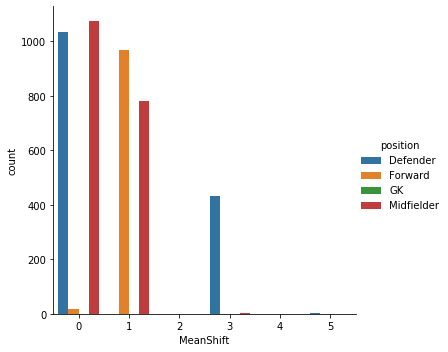

In [59]:
quantile_list = [0.15]
for q in quantile_list:
  bandwidth = estimate_bandwidth(X, quantile=q)
  print('Ancho de vanda estimado:', bandwidth)
  ms = MeanShift(bandwidth=bandwidth, n_jobs=-1)
  ms.fit(X)

  clusters_ms = ms.labels_
  cluster_centers = ms.cluster_centers_

  labels_unique = np.unique(clusters_ms)
  n_clusters_ms = len(labels_unique)

  print("Numero estimado de clusters para Mean Shift : %d" % n_clusters_ms)

  df_clusters_mshift=df_nngk.copy()
  df_clusters_mshift['MeanShift'] = ms.labels_

  for i in list(range(0,n_clusters_ms)):
    print(df_clusters_mshift[df_clusters_mshift['MeanShift']==i]['position'].value_counts())
    
  df_clusters_mshift['MeanShift'] = df_clusters_mshift['MeanShift'].astype(str)
  ax =sns.catplot(x='MeanShift', hue='position', kind='count',data=df_clusters_mshift)

In [60]:
df_skills['Clusters'] = clusters_ms

In [61]:
means = []

for i in list(range(0,n_clusters_ms)):
    tmp = df_skills[df_skills['Clusters']==i].drop(columns='Clusters')
    mean = tmp.mean().to_numpy()
    means.append(mean)
    
means = np.array(means)
c=28 # Selecciono las habilidades que no son de arqueros

v1, v2 = 0, 0
dist_old = 0
for j in list(range(c-1)):
    for k in list(range(j+1,c)):
        # distintas opciones de medidas que podemos tomar
        # dist = np.min(np.abs(means[:,j]-means[:,k]))
        dist = np.linalg.norm((means[:,j]-means[:,k]))
        if dist > dist_old:
            v1, v2 = j, k
            dist_old =dist
print(v1,v2)            
sk1 = df_skills.columns[v1]
sk2 = df_skills.columns[v2]

1 27


In [62]:
data=[]
bool_crack=df_n["overall"] > 85
bool_no_crack=df_n["overall"]<86


#Eligo dos números entre 0 y  de n_skills-1
skill_1=sk1
skill_2=sk2


MeanShift_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_nngk.loc[:,'position'],
                           marker=dict(
                                size=10,
                                color = clusters_ms.astype(np.float), #set color equal to a variable
                                colorscale='deep',
                                showscale=False)
                           )
players_positions = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                           text=df_nngk.loc[:,'position'],
                           marker=dict(
                                size=3,
                                symbol='x',
                                color = df_n['position_color'], #set color equal to a variable
                                colorscale='jet',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_nngk.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

# data=[MeanShift_clusters,players_positions,crack]
data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1700,height=1000)

fig = go.Figure(data=data, layout=layout)

if in_colab:
  from google.colab import files
  fig.write_html('plot-grafico-mean-shift.html')
  files.download('plot-grafico-mean-shift.html')
else:
  iplot(fig)

In [63]:
df_cluster_mshift=df_nngk.copy()
df_cluster_mshift['group_label'] = ms.labels_ #clusters

In [64]:
# Cantidad de observaciones por Cluster
df_cluster_count = df_cluster_mshift.groupby(by=['group_label']).count()[['sofifa_id']]
df_cluster_count.columns = ['observaciones']

print('Tabla de cantidad de observaciones por Cluster:')

df_cluster_count

Tabla de cantidad de observaciones por Cluster:


,observaciones
group_label,
0,2128
1,1750
2,1
3,434
4,1
5,2


In [65]:
# Analisis descriptivo por Cluster
def analisis_cluster(cluster_num):
  print( 'Descripción del cluster', cluster_num )
  df_cluster_ms = df_cluster_mshift[df_cluster_mshift.group_label == cluster_num]
  display(df_cluster_ms[skills_ratings].describe())
  print('\n __________________________________________________ \n')
  print('Tabla de conteo y grafico de posiciones en este cluster: ')
  display(df_cluster_ms['main_position'].value_counts())
  ax =sns.catplot(x='position', kind='count', data=df_cluster_mshift[df_cluster_mshift['group_label']==cluster_num])
  print('\n __________________________________________________ \n')

Descripción del cluster 0


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,2128.000000,2128.00000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000,2128.000000
mean,65.478383,52.62453,64.389568,73.568139,51.555451,68.939850,61.554041,54.597744,69.685620,72.449248,68.498590,68.679511,69.009398,72.508459,67.819549,68.588346,70.465695,76.677632,71.373590,60.512688,73.757989,72.105733,61.374530,65.624060,55.439380,71.313910,70.522086,72.966165,70.468045,10.530545,10.660714,10.729323,10.680451,10.581297
std,11.231860,12.70128,10.012405,5.656610,13.476886,8.231726,13.162286,14.906757,7.238521,6.078182,10.763125,11.113033,9.349501,5.219392,11.086587,10.244206,10.629847,8.767510,8.872179,13.379205,8.336944,6.042445,11.644808,10.336402,11.806825,6.676637,6.934612,5.815837,7.040144,3.100420,3.116228,3.152009,3.163668,3.130145
min,22.000000,18.00000,22.000000,49.000000,11.000000,33.000000,21.000000,16.000000,30.000000,48.000000,30.000000,29.000000,30.000000,55.000000,29.000000,25.000000,30.000000,33.000000,29.000000,13.000000,36.000000,44.000000,20.000000,26.000000,20.000000,38.000000,31.000000,48.000000,36.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,59.000000,43.00000,58.000000,70.000000,41.000000,64.000000,53.000000,43.000000,66.000000,69.000000,63.000000,63.000000,64.000000,69.000000,61.000000,63.000000,64.000000,71.000000,66.000000,53.000000,69.000000,68.000000,55.000000,59.000000,47.000000,67.000000,67.000000,70.000000,67.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,68.000000,54.00000,65.000000,74.000000,52.000000,70.000000,64.000000,55.000000,70.000000,73.000000,69.000000,69.000000,69.000000,72.000000,69.000000,70.000000,71.000000,77.000000,72.000000,63.000000,74.000000,72.000000,64.000000,67.000000,55.000000,71.000000,71.000000,73.000000,71.000000,10.000000,11.000000,11.000000,11.000000,10.000000
75%,73.000000,63.00000,72.000000,77.000000,62.000000,75.000000,71.000000,67.000000,74.000000,76.000000,76.000000,76.000000,75.000000,76.000000,75.250000,76.000000,77.000000,83.000000,77.000000,71.000000,80.000000,76.000000,69.000000,73.000000,64.000000,76.000000,75.000000,77.000000,75.000000,13.000000,13.000000,13.000000,13.000000,13.000000
max,91.000000,85.00000,92.000000,92.000000,87.000000,90.000000,91.000000,92.000000,92.000000,92.000000,94.000000,94.000000,93.000000,93.000000,94.000000,95.000000,94.000000,97.000000,93.000000,88.000000,95.000000,92.000000,90.000000,91.000000,91.000000,95.000000,94.000000,92.000000,90.000000,22.000000,22.000000,28.000000,24.000000,23.000000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


CM     509
CB     432
CDM    425
RB     299
LB     269
CAM     58
RM      43
LM      40
LWB     19
RWB     16
RW       7
ST       6
LW       4
CF       1
GK       0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 1


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000,1750.000000
mean,65.098286,71.932571,60.873143,71.016000,66.856571,75.317714,67.574286,60.592571,61.313714,75.408000,75.873714,75.386286,76.156571,71.848000,72.013143,74.208571,66.601143,70.154857,66.026857,69.162857,57.864000,36.041714,73.702857,68.925714,67.013714,71.400571,37.678857,35.223429,31.123429,10.593714,10.648000,10.653714,10.503429,10.502857
std,11.214196,6.384392,13.599302,6.017107,8.671207,6.004256,10.761350,13.730363,10.824257,5.155262,10.675662,10.169655,10.192686,5.938294,12.166199,6.526494,12.903069,8.909462,13.303076,7.231790,13.575691,12.182150,5.903623,8.193149,8.578687,6.804137,12.323854,12.160534,11.336158,3.140700,3.098642,3.138334,3.162231,3.195863
min,25.000000,44.000000,20.000000,52.000000,32.000000,53.000000,26.000000,22.000000,21.000000,57.000000,28.000000,30.000000,32.000000,54.000000,29.000000,39.000000,29.000000,30.000000,27.000000,40.000000,22.000000,10.000000,53.000000,38.000000,31.000000,47.000000,10.000000,10.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,60.000000,68.000000,50.000000,67.000000,62.000000,72.000000,62.000000,51.000000,55.000000,72.000000,70.000000,70.000000,71.000000,68.000000,66.000000,70.000000,59.000000,66.000000,58.000000,65.000000,48.000000,26.000000,70.000000,64.000000,62.000000,67.000000,28.000000,25.000000,22.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,67.000000,72.000000,62.000000,71.000000,68.000000,75.000000,68.000000,63.000000,63.000000,75.000000,77.000000,76.000000,77.000000,71.000000,73.000000,75.000000,68.000000,71.000000,67.000000,69.000000,58.000000,35.000000,73.000000,70.000000,68.000000,71.000000,37.000000,34.000000,29.000000,11.000000,11.000000,11.000000,10.000000,10.000000
75%,72.000000,76.000000,72.000000,75.000000,73.000000,79.000000,75.000000,71.000000,69.000000,78.000000,83.000000,82.000000,83.000000,75.000000,80.000000,78.000000,75.000000,76.000000,75.000000,74.000000,68.000000,45.000000,77.000000,74.000000,73.000000,76.000000,47.000000,44.000000,39.000000,13.000000,13.000000,13.000000,13.000000,13.000000
max,93.000000,95.000000,93.000000,92.000000,90.000000,97.000000,94.000000,94.000000,92.000000,96.000000,97.000000,96.000000,96.000000,96.000000,96.000000,95.000000,95.000000,93.000000,95.000000,94.000000,93.000000,69.000000,95.000000,94.000000,92.000000,96.000000,73.000000,67.000000,69.000000,27.000000,25.000000,31.000000,33.000000,37.000000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


ST     715
CAM    302
LM     229
RM     208
RW     106
LW     105
CM      43
CF      42
RWB      0
RB       0
LWB      0
LB       0
GK       0
CDM      0
CB       0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 2


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0
25%,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0
50%,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0
75%,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0
max,79.0,48.0,69.0,71.0,49.0,78.0,55.0,49.0,75.0,75.0,81.0,75.0,82.0,81.0,75.0,52.0,51.0,85.0,62.0,56.0,62.0,77.0,57.0,61.0,41.0,54.0,78.0,77.0,76.0,75.0,53.0,42.0,60.0,45.0



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


RB     1
ST     0
RWB    0
RW     0
RM     0
LWB    0
LW     0
LM     0
LB     0
GK     0
CM     0
CF     0
CDM    0
CB     0
CAM    0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 3


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.00000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000
mean,39.251152,30.460829,74.375576,63.331797,31.140553,46.868664,35.304147,32.707373,58.753456,58.640553,51.479263,54.578341,48.896313,68.928571,49.559908,53.642857,71.483871,63.788018,81.815668,34.361751,76.016129,73.440092,33.64977,41.993088,41.965438,66.493088,73.617512,75.202765,72.615207,10.728111,10.705069,10.700461,10.843318,10.728111
std,10.906026,8.673422,4.694791,6.470081,9.321364,8.972567,9.415708,10.328310,8.780966,6.256992,11.266283,12.140615,10.794141,4.733739,11.212306,12.050284,12.385679,10.726120,6.098357,11.623044,6.517854,4.586591,9.27471,9.940816,10.592001,6.398701,4.410911,3.951249,4.216086,3.190603,3.333035,3.362976,3.295089,3.254387
min,11.000000,13.000000,58.000000,44.000000,13.000000,22.000000,13.000000,13.000000,25.000000,34.000000,28.000000,29.000000,26.000000,57.000000,26.000000,15.000000,30.000000,29.000000,64.000000,12.000000,45.000000,61.000000,12.00000,13.000000,13.000000,32.000000,63.000000,64.000000,61.000000,3.000000,3.000000,3.000000,3.000000,3.000000
25%,31.250000,24.000000,71.000000,59.000000,25.000000,41.000000,29.000000,26.000000,53.250000,55.000000,43.000000,47.000000,40.000000,66.000000,40.250000,45.000000,67.000000,58.000000,77.000000,26.000000,72.000000,70.000000,27.00000,34.000000,35.000000,62.250000,70.250000,72.250000,70.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,38.000000,29.000000,74.000000,64.000000,30.000000,47.000000,33.500000,31.000000,60.000000,59.000000,53.000000,55.000000,51.000000,69.000000,51.000000,52.500000,74.000000,65.000000,82.000000,32.000000,76.000000,73.000000,32.00000,42.000000,41.000000,67.000000,73.000000,75.000000,72.000000,11.000000,10.500000,11.000000,10.500000,11.000000
75%,46.000000,36.000000,77.000000,68.000000,35.000000,53.000000,40.000000,37.000000,65.000000,63.000000,61.000000,64.000000,57.000000,72.000000,58.000000,62.000000,79.000000,71.000000,86.000000,41.000000,80.000000,77.000000,39.00000,49.000000,47.000000,71.000000,76.000000,77.750000,75.000000,13.000000,13.000000,13.000000,14.000000,13.000000
max,69.000000,60.000000,90.000000,78.000000,62.000000,69.000000,69.000000,69.000000,80.000000,73.000000,79.000000,87.000000,75.000000,86.000000,79.000000,85.000000,94.000000,93.000000,95.000000,71.000000,92.000000,88.000000,67.00000,66.000000,79.000000,82.000000,91.000000,90.000000,87.000000,32.000000,33.000000,38.000000,32.000000,34.000000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


CB     431
CDM      2
RB       1
ST       0
RWB      0
RW       0
RM       0
LWB      0
LW       0
LM       0
LB       0
GK       0
CM       0
CF       0
CAM      0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 4


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0
mean,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0
25%,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0
50%,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0
75%,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0
max,40.0,56.0,80.0,67.0,63.0,60.0,72.0,58.0,58.0,64.0,67.0,74.0,61.0,76.0,63.0,74.0,91.0,60.0,77.0,61.0,86.0,82.0,58.0,50.0,62.0,70.0,83.0,82.0,82.0,58.0,62.0,54.0,71.0,48.0



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


CB     1
ST     0
RWB    0
RW     0
RM     0
RB     0
LWB    0
LW     0
LM     0
LB     0
GK     0
CM     0
CF     0
CDM    0
CAM    0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 5


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,2.000000,2.000000,2.00000,2.000000,2.00000,2.000000,2.000000,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.00000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.0,2.000000,2.000000,2.000000,2.000000,2.000000,2.00000,2.000000,2.000000,2.000000,2.000000,2.00000,2.000000,2.00000
mean,33.500000,31.500000,81.50000,67.000000,30.00000,55.000000,37.500000,29.500000,61.0,68.500000,82.000000,80.500000,72.500000,83.50000,64.000000,46.500000,77.500000,74.000000,77.500000,26.500000,86.0,84.000000,31.500000,32.000000,41.000000,78.000000,85.50000,86.000000,82.500000,33.000000,23.000000,36.00000,35.500000,27.50000
std,9.192388,9.192388,2.12132,9.899495,19.79899,1.414214,10.606602,27.577164,0.0,4.949747,1.414214,3.535534,6.363961,2.12132,5.656854,9.192388,12.020815,2.828427,6.363961,20.506097,0.0,2.828427,9.192388,14.142136,21.213203,9.899495,2.12132,1.414214,9.192388,35.355339,24.041631,39.59798,28.991378,21.92031
min,27.000000,25.000000,80.00000,60.000000,16.00000,54.000000,30.000000,10.000000,61.0,65.000000,81.000000,78.000000,68.000000,82.00000,60.000000,40.000000,69.000000,72.000000,73.000000,12.000000,86.0,82.000000,25.000000,22.000000,26.000000,71.000000,84.00000,85.000000,76.000000,8.000000,6.000000,8.00000,15.000000,12.00000
25%,30.250000,28.250000,80.75000,63.500000,23.00000,54.500000,33.750000,19.750000,61.0,66.750000,81.500000,79.250000,70.250000,82.75000,62.000000,43.250000,73.250000,73.000000,75.250000,19.250000,86.0,83.000000,28.250000,27.000000,33.500000,74.500000,84.75000,85.500000,79.250000,20.500000,14.500000,22.00000,25.250000,19.75000
50%,33.500000,31.500000,81.50000,67.000000,30.00000,55.000000,37.500000,29.500000,61.0,68.500000,82.000000,80.500000,72.500000,83.50000,64.000000,46.500000,77.500000,74.000000,77.500000,26.500000,86.0,84.000000,31.500000,32.000000,41.000000,78.000000,85.50000,86.000000,82.500000,33.000000,23.000000,36.00000,35.500000,27.50000
75%,36.750000,34.750000,82.25000,70.500000,37.00000,55.500000,41.250000,39.250000,61.0,70.250000,82.500000,81.750000,74.750000,84.25000,66.000000,49.750000,81.750000,75.000000,79.750000,33.750000,86.0,85.000000,34.750000,37.000000,48.500000,81.500000,86.25000,86.500000,85.750000,45.500000,31.500000,50.00000,45.750000,35.25000
max,40.000000,38.000000,83.00000,74.000000,44.00000,56.000000,45.000000,49.000000,61.0,72.000000,83.000000,83.000000,77.000000,85.00000,68.000000,53.000000,86.000000,76.000000,82.000000,41.000000,86.0,86.000000,38.000000,42.000000,56.000000,85.000000,87.00000,87.000000,89.000000,58.000000,40.000000,64.00000,56.000000,43.00000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


CB     2
ST     0
RWB    0
RW     0
RM     0
RB     0
LWB    0
LW     0
LM     0
LB     0
GK     0
CM     0
CF     0
CDM    0
CAM    0
Name: main_position, dtype: int64


 __________________________________________________ 



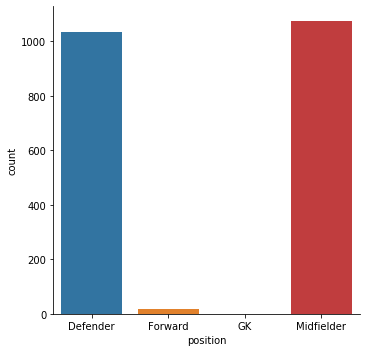

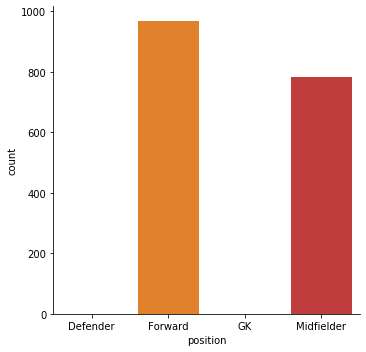

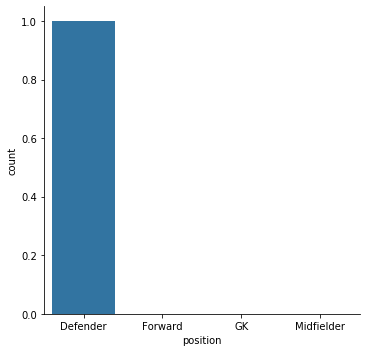

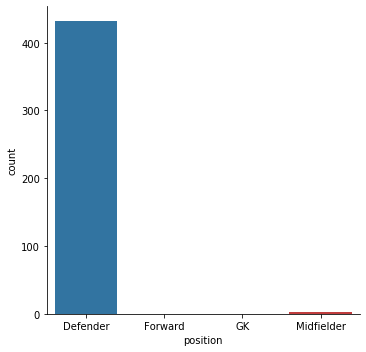

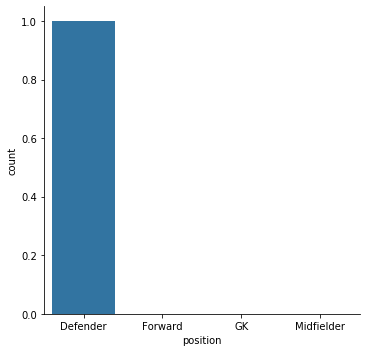

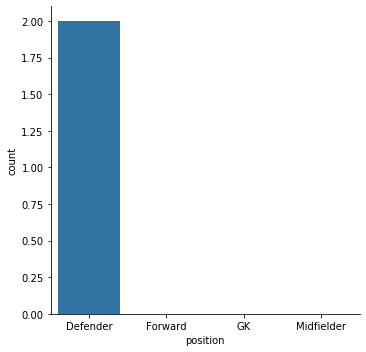

In [66]:
for i in list(range(0,n_clusters_ms)):
  analisis_cluster(i)

In [67]:
# Tablas de contingencia main_position vs clusters y position vs clusters
for i in list(range(0,n_clusters_ms)):
  df_cluster_mshift['group_label'] = df_cluster_mshift['group_label'].replace(i,'cluster_'+str(i))

display(pd.crosstab(index=df_cluster_mshift['main_position'],columns=df_cluster_mshift['group_label']))
print('\n __________________________________________________ \n')
pd.crosstab(index=df_cluster_mshift['position'],columns=df_cluster_mshift['group_label'])

group_label,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5
main_position,,,,,,
CAM,58,302,0,0,0,0
CB,432,0,0,431,1,2
CDM,425,0,0,2,0,0
CF,1,42,0,0,0,0
CM,509,43,0,0,0,0
LB,269,0,0,0,0,0
LM,40,229,0,0,0,0
LW,4,105,0,0,0,0
LWB,19,0,0,0,0,0



 __________________________________________________ 



group_label,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5
position,,,,,,
Defender,1035,0,1,432,1,2
Forward,18,968,0,0,0,0
Midfielder,1075,782,0,2,0,0


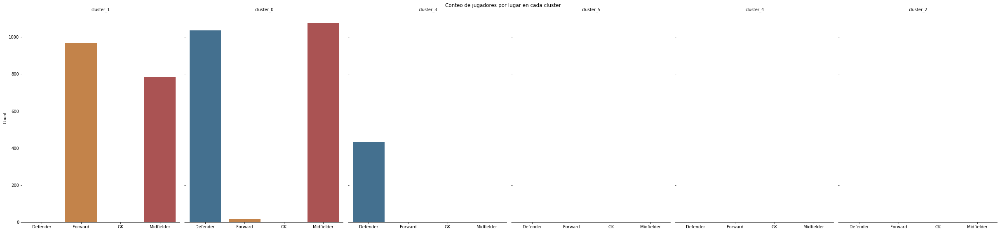

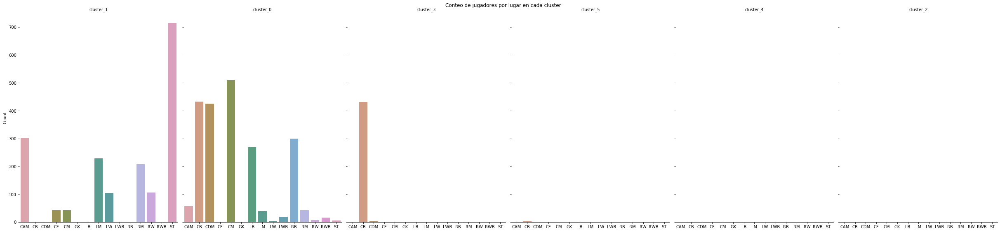

In [68]:
# Gráfico de las cantidad de jugadores por posiciones discriminados por lugar en cancha
g = sns.catplot(x="position", col="group_label",
                data=df_cluster_mshift, saturation=.5,
                kind="count", ci=None, height=8, aspect=0.7)
g.fig.suptitle('Conteo de jugadores por lugar en cada cluster', y=1)
(g.set_axis_labels("", "Count").set_titles("{col_name}").despine(left=True)) 

# Gráfico de las cantidad de jugadores discriminados por posición
g = sns.catplot(x="main_position", col="group_label",
                data=df_cluster_mshift, saturation=.5,
                kind="count", ci=None, height=8, aspect=0.7)
g.fig.suptitle('Conteo de jugadores por lugar en cada cluster', y=1)
(g.set_axis_labels("", "Count").set_titles("{col_name}").despine(left=True)) 

# 7.- Agglomerative-Clustering-sin-Arqueros

In [69]:
df_nngk=df_n[(df_n["main_position"]!='GK')&(df_n['overall']>70)]
# Eliminamos el jugador 'artificial' MachineGun
df_nngk = df_nngk.head(-1)
df_skills = df_nngk[skills_ratings]
X=df_skills # Datos para proyectar

In [70]:
agg = AgglomerativeClustering(n_clusters=3,affinity='manhattan',linkage='complete').fit(X)

clusters_agg = agg.labels_

labels_unique = np.unique(clusters_agg)
n_clusters_agg = len(labels_unique)

print("Numero estimado de clusters para agglomerative clustering : %d" % n_clusters_agg)

Numero estimado de clusters para agglomerative clustering : 3


In [71]:
df_clusters_agg=df_nngk.copy()
df_clusters_agg['AggClusters'] = agg.labels_

for i in list(range(0,n_clusters_agg)):
    print(df_clusters_agg[df_clusters_agg['AggClusters']==i]['position'].value_counts())

Midfielder    1130
Forward        976
Defender        70
GK               0
Name: position, dtype: int64
Defender      908
Midfielder    718
Forward        10
GK              0
Name: position, dtype: int64
Defender      493
Midfielder     11
GK              0
Forward         0
Name: position, dtype: int64


In [72]:
data=[]
bool_crack=df_nngk["overall"] > 85
bool_no_crack=df_nngk["overall"]<86

#Eligo dos números entre 0 y  de n_skills-1
skill_1=sk1
skill_2=sk2


Agg_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_nngk.loc[:,'position'],
                           marker=dict(
                                size=10,
                                color = clusters_agg.astype(np.float), #set color equal to a variable
                                colorscale='deep',
                                showscale=False)
                           )
players_positions = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                           text=df_nngk.loc[:,'position'],
                           marker=dict(
                                size=3,
                                symbol='x',
                                color = df_nngk['position_color'], #set color equal to a variable
                                colorscale='jet',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_nngk.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[Agg_clusters,players_positions,crack]

layout = go.Layout(title="Agglomeraitce Clustering",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1700,height=1000)

fig = go.Figure(data=data, layout=layout)

if in_colab:
  from google.colab import files
  fig.write_html('plot-grafico-agglomerative.html')
  files.download('plot-grafico-agglomerative.html')
else:
  iplot(fig)

In [73]:
df_cluster_aggc=df_nngk.copy()
df_cluster_aggc['group_label'] = agg.labels_

In [74]:
# Cantidad de observaciones por Cluster
df_cluster_count = df_cluster_mshift.groupby(by=['group_label']).count()[['sofifa_id']]
df_cluster_count.columns = ['observaciones']

print('Tabla de cantidad de observaciones por Cluster:')

df_cluster_count

Tabla de cantidad de observaciones por Cluster:


,observaciones
group_label,
cluster_0,2128
cluster_1,1750
cluster_2,1
cluster_3,434
cluster_4,1
cluster_5,2


In [75]:
# Analisis descriptivo por Cluster
def analisis_cluster(cluster_num):
  print( 'Descripción del cluster', cluster_num )
  df_cluster_ag = df_cluster_aggc[df_cluster_aggc.group_label == cluster_num]
  display(df_cluster_ag[skills_ratings].describe())
  print('\n __________________________________________________ \n')
  print('Tabla de conteo y grafico de posiciones en este cluster: ')
  display(df_cluster_ag['main_position'].value_counts())
  print('\n __________________________________________________ \n')

In [76]:
for i in list(range(0,n_clusters_agg)):
  analisis_cluster(i)

Descripción del cluster 0


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000,2176.000000
mean,66.473346,70.500919,61.031710,72.577206,66.394761,75.380055,68.820312,62.422335,64.238971,75.993566,74.117647,73.433824,75.263327,72.670956,71.903493,74.524816,66.590074,71.307904,66.572610,69.771140,60.734835,43.006434,73.085018,70.335018,66.934743,72.453125,43.776195,42.278033,38.179228,10.532169,10.638787,10.667739,10.510570,10.469210
std,10.965200,7.210401,13.200885,6.575784,8.886821,5.956574,10.550039,13.523124,11.621536,5.191412,11.520175,11.342899,10.287770,6.106353,11.915907,6.625158,12.615778,9.373715,12.726414,7.302339,14.013885,18.200239,6.231742,8.237977,8.759802,6.999679,17.088734,18.320829,18.071812,3.179080,3.130134,3.154473,3.176766,3.186461
min,25.000000,34.000000,20.000000,52.000000,32.000000,53.000000,26.000000,22.000000,21.000000,57.000000,28.000000,29.000000,32.000000,54.000000,29.000000,39.000000,29.000000,30.000000,27.000000,40.000000,22.000000,10.000000,38.000000,38.000000,31.000000,47.000000,10.000000,10.000000,10.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,62.000000,66.000000,51.000000,68.000000,61.000000,72.000000,63.000000,54.000000,58.000000,72.750000,67.000000,67.000000,69.000000,68.000000,66.000000,70.000000,59.000000,66.000000,59.000000,65.000000,51.000000,29.000000,69.000000,66.000000,61.750000,68.000000,30.000000,28.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,68.000000,71.000000,61.000000,73.000000,67.000000,75.500000,70.000000,65.000000,66.000000,75.000000,75.000000,75.000000,76.000000,72.000000,73.000000,75.000000,68.000000,72.000000,67.000000,70.000000,62.000000,39.000000,73.000000,71.000000,68.000000,72.000000,41.000000,38.000000,34.000000,11.000000,11.000000,11.000000,10.000000,10.000000
75%,74.000000,75.000000,72.000000,77.000000,72.000000,79.000000,76.000000,73.000000,73.000000,79.000000,82.000000,81.000000,82.000000,76.000000,79.000000,79.000000,75.000000,77.000000,75.000000,74.000000,72.000000,55.000000,77.000000,76.000000,73.000000,77.000000,56.000000,55.000000,50.000000,13.000000,13.000000,13.000000,13.000000,13.000000
max,93.000000,95.000000,93.000000,92.000000,90.000000,97.000000,94.000000,94.000000,92.000000,96.000000,97.000000,96.000000,96.000000,96.000000,96.000000,95.000000,95.000000,97.000000,95.000000,94.000000,94.000000,92.000000,95.000000,94.000000,92.000000,96.000000,91.000000,92.000000,90.000000,27.000000,25.000000,31.000000,33.000000,37.000000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


ST     716
CAM    342
CM     274
LM     240
RM     222
RW     110
LW     107
CDM     52
CF      43
LB      31
CB      19
RB      18
RWB      1
LWB      1
GK       0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 1


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.000000,1636.00000,1636.000000,1636.000000,1636.000000
mean,64.350856,50.305623,64.895477,72.396699,49.139976,67.698044,59.263447,51.420538,68.300733,71.183374,68.745110,69.364303,68.457213,71.808680,67.080073,67.562347,71.261614,76.802567,71.811736,58.649756,74.129584,72.293399,59.699267,63.401589,53.201711,70.124083,71.007335,73.421760,71.331296,10.740220,10.74511,10.830685,10.817237,10.752445
std,11.064189,11.576027,9.584172,4.950491,11.877997,7.623432,11.907992,13.247645,6.604050,5.362971,10.852943,10.927811,9.394904,4.716885,11.122353,9.444402,10.074039,8.875256,8.548763,11.986341,8.363110,5.526537,11.048352,9.371476,10.246665,6.075459,6.255122,5.174212,5.988492,3.820962,3.56544,3.644954,3.851554,3.457982
min,22.000000,17.000000,22.000000,49.000000,16.000000,33.000000,21.000000,16.000000,30.000000,48.000000,30.000000,30.000000,30.000000,55.000000,29.000000,30.000000,32.000000,37.000000,29.000000,13.000000,34.000000,44.000000,22.000000,27.000000,22.000000,38.000000,42.000000,56.000000,40.000000,1.000000,1.00000,1.000000,1.000000,1.000000
25%,58.000000,42.000000,59.000000,69.000000,40.000000,64.000000,52.000000,41.000000,65.000000,68.000000,63.000000,64.000000,63.000000,69.000000,61.000000,62.000000,66.000000,71.000000,67.000000,51.000000,69.000000,69.000000,54.000000,58.000000,46.000000,66.000000,67.000000,70.000000,68.000000,8.000000,8.00000,8.000000,8.000000,8.000000
50%,67.000000,51.000000,66.000000,73.000000,50.000000,69.000000,61.000000,51.000000,69.000000,72.000000,69.000000,70.000000,69.000000,72.000000,68.000000,69.000000,72.000000,77.000000,73.000000,61.000000,74.500000,72.000000,62.000000,65.000000,53.000000,70.000000,71.000000,73.000000,72.000000,11.000000,11.00000,11.000000,11.000000,11.000000
75%,72.000000,59.000000,72.000000,76.000000,58.000000,73.000000,68.000000,62.000000,73.000000,75.000000,76.000000,76.250000,75.000000,75.000000,75.000000,74.000000,78.000000,83.000000,77.000000,68.000000,80.000000,76.000000,68.000000,70.000000,61.000000,74.000000,75.000000,77.000000,75.000000,13.000000,13.00000,13.000000,13.000000,13.000000
max,89.000000,77.000000,89.000000,85.000000,81.000000,84.000000,87.000000,89.000000,84.000000,85.000000,94.000000,94.000000,93.000000,86.000000,92.000000,89.000000,94.000000,96.000000,93.000000,86.000000,95.000000,89.000000,82.000000,83.000000,87.000000,86.000000,94.000000,91.000000,89.000000,75.000000,62.00000,64.000000,71.000000,48.000000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


CDM    364
CB     357
RB     280
CM     278
LB     238
RM      29
LM      29
LWB     18
CAM     18
RWB     15
ST       5
RW       3
LW       2
GK       0
CF       0
Name: main_position, dtype: int64


 __________________________________________________ 

Descripción del cluster 2


,attacking_crossing,attacking_finishing,attacking_heading_accuracy,attacking_short_passing,attacking_volleys,skill_dribbling,skill_curve,skill_fk_accuracy,skill_long_passing,skill_ball_control,movement_acceleration,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,mentality_aggression,mentality_interceptions,mentality_positioning,mentality_vision,mentality_penalties,mentality_composure,defending_marking,defending_standing_tackle,defending_sliding_tackle,goalkeeping_diving,goalkeeping_handling,goalkeeping_kicking,goalkeeping_positioning,goalkeeping_reflexes
count,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000,504.000000
mean,40.787698,30.841270,73.742063,63.928571,30.809524,48.250000,35.829365,32.990079,59.166667,59.611111,54.466270,57.144841,51.321429,68.769841,51.414683,52.823413,72.103175,65.680556,81.123016,33.960317,75.585317,73.134921,35.051587,43.440476,41.585317,66.396825,73.146825,74.934524,72.388889,10.543651,10.710317,10.626984,10.811508,10.573413
std,11.659712,8.703339,5.230372,6.504843,8.853088,9.403956,9.180900,10.141636,8.468395,6.546329,12.033702,12.664067,11.415166,4.590010,11.494171,11.729327,12.485430,10.500740,6.385616,11.172354,6.459898,4.463865,10.152384,10.552361,10.656048,6.284291,4.295991,3.853902,4.168846,3.113186,3.295188,3.326463,3.271387,3.226778
min,11.000000,13.000000,40.000000,44.000000,11.000000,22.000000,13.000000,10.000000,25.000000,34.000000,28.000000,29.000000,26.000000,56.000000,26.000000,15.000000,30.000000,29.000000,58.000000,12.000000,45.000000,61.000000,12.000000,13.000000,13.000000,32.000000,62.000000,64.000000,61.000000,3.000000,3.000000,3.000000,3.000000,3.000000
25%,33.000000,24.000000,71.000000,60.000000,25.000000,42.000000,29.000000,26.000000,54.000000,55.000000,47.000000,49.750000,44.000000,66.000000,42.000000,45.000000,67.000000,61.000000,77.000000,26.000000,71.000000,70.000000,28.000000,35.000000,35.000000,63.000000,70.000000,72.000000,70.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,39.000000,30.000000,74.000000,65.000000,30.000000,49.000000,34.000000,31.000000,60.000000,60.000000,56.000000,60.000000,53.000000,68.000000,53.000000,52.000000,74.000000,67.000000,81.000000,32.000000,76.000000,73.000000,34.000000,43.000000,40.000000,67.000000,73.000000,75.000000,72.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,49.000000,36.000000,77.000000,68.000000,35.000000,55.000000,42.000000,37.000000,65.000000,64.000000,64.000000,66.000000,60.000000,72.000000,60.000000,60.000000,80.000000,72.000000,86.000000,40.000000,80.000000,76.000000,41.250000,51.000000,47.000000,71.000000,76.000000,77.000000,75.000000,13.000000,13.000000,13.000000,14.000000,13.000000
max,77.000000,60.000000,90.000000,80.000000,62.000000,74.000000,65.000000,71.000000,80.000000,77.000000,81.000000,88.000000,77.000000,86.000000,79.000000,85.000000,94.000000,93.000000,95.000000,78.000000,92.000000,88.000000,67.000000,75.000000,79.000000,85.000000,91.000000,90.000000,89.000000,32.000000,33.000000,38.000000,32.000000,34.000000



 __________________________________________________ 

Tabla de conteo y grafico de posiciones en este cluster: 


CB     490
CDM     11
RB       3
ST       0
RWB      0
RW       0
RM       0
LWB      0
LW       0
LM       0
LB       0
GK       0
CM       0
CF       0
CAM      0
Name: main_position, dtype: int64


 __________________________________________________ 



In [77]:
# Tablas de contingencia main_position vs clusters y position vs clusters
for i in list(range(0,n_clusters_ms)):
  df_cluster_aggc['group_label'] = df_cluster_aggc['group_label'].replace(i,'cluster_'+str(i))

display(pd.crosstab(index=df_cluster_aggc['main_position'],columns=df_cluster_aggc['group_label']))
print('\n __________________________________________________ \n')
pd.crosstab(index=df_cluster_aggc['position'],columns=df_cluster_aggc['group_label'])

group_label,cluster_0,cluster_1,cluster_2
main_position,,,
CAM,342,18,0
CB,19,357,490
CDM,52,364,11
CF,43,0,0
CM,274,278,0
LB,31,238,0
LM,240,29,0
LW,107,2,0
LWB,1,18,0



 __________________________________________________ 



group_label,cluster_0,cluster_1,cluster_2
position,,,
Defender,70,908,493
Forward,976,10,0
Midfielder,1130,718,11


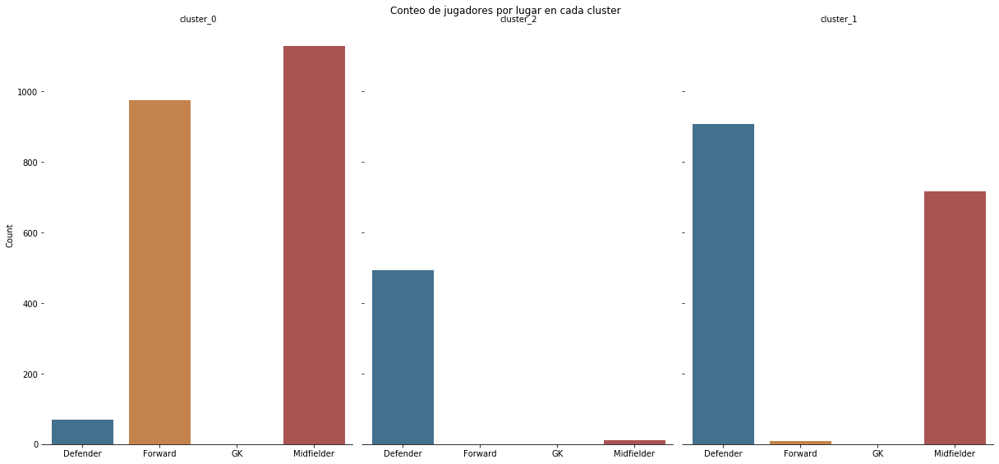

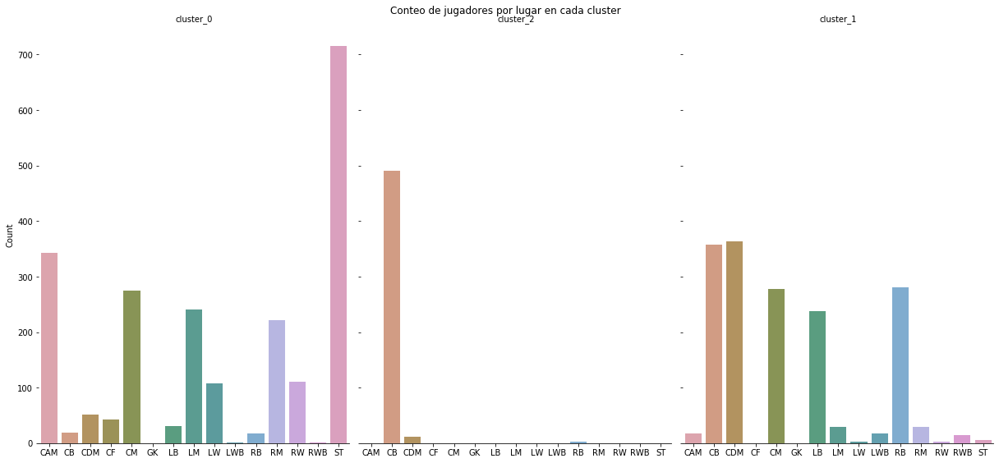

In [78]:
# Gráfico de las cantidad de jugadores por posiciones discriminados por lugar en cancha
g = sns.catplot(x="position", col="group_label",
                data=df_cluster_aggc, saturation=.5,
                kind="count", ci=None, height=8, aspect=0.7)
g.fig.suptitle('Conteo de jugadores por lugar en cada cluster', y=1)
(g.set_axis_labels("", "Count").set_titles("{col_name}").despine(left=True)) 

# Gráfico de las cantidad de jugadores discriminados por posición
g = sns.catplot(x="main_position", col="group_label",
                data=df_cluster_aggc, saturation=.5,
                kind="count", ci=None, height=8, aspect=0.7)
g.fig.suptitle('Conteo de jugadores por lugar en cada cluster', y=1)
(g.set_axis_labels("", "Count").set_titles("{col_name}").despine(left=True)) 

## Hierarchical Clustering

In [79]:
names = df_cluster_aggc.short_name.tolist()

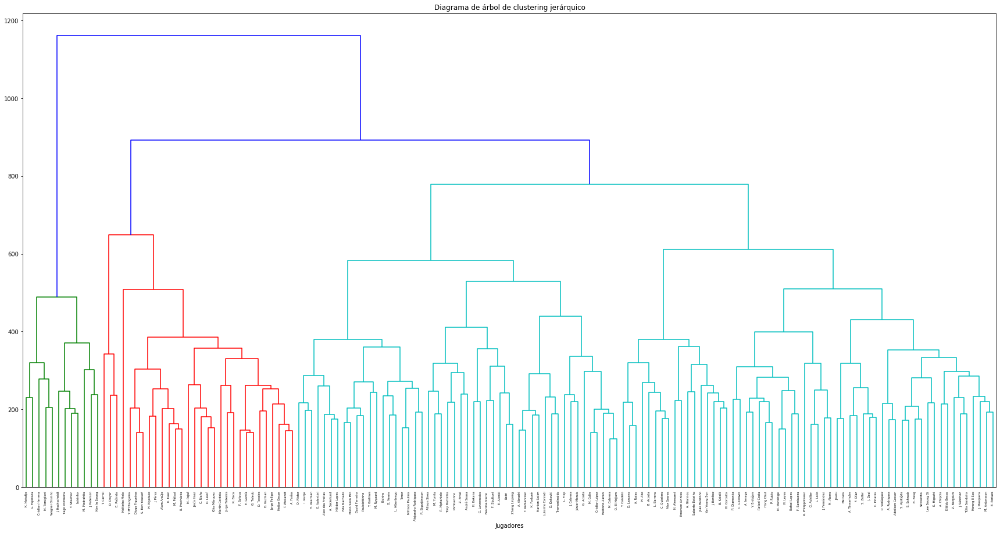

In [80]:
# Diagrama de árbol 
from scipy.cluster.hierarchy import dendrogram


def plot_dendrogram(model, **kwargs):
    # Create linkage matrix and then plot the dendrogram
    # create the counts of samples under each node
    counts = np.zeros(model.children_.shape[0])
    n_samples = len(model.labels_)
    for i, merge in enumerate(model.children_):
        current_count = 0
        for child_idx in merge:
            if child_idx < n_samples:
                current_count += 1  # leaf node
            else:
                current_count += counts[child_idx - n_samples]
        counts[i] = current_count

    linkage_matrix = np.column_stack([model.children_, model.distances_,
                                      counts]).astype(float)
    # Plot the corresponding dendrogram
    dendrogram(linkage_matrix, labels=names, **kwargs)


# Nuevo modelo para grafricar todos los niveles y sólo 150 ejemplos para facilitar la visualización
model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, affinity='manhattan', linkage='complete')
model = model.fit(X.sample(n=150))
# plot del diagrama
plt.figure(figsize=(30,15))
plt.title('Diagrama de árbol de clustering jerárquico')
plot_dendrogram(model, truncate_mode=None)
plt.xlabel("Jugadores")
plt.show()

# 8.-Visualizacion-con-embeddings:tSNE

In [81]:
if in_colab:
  df=pd.read_csv("https://raw.githubusercontent.com/gbrlm/tp_nosupervisado/main/players_20.csv")
else:
  df=pd.read_csv("players_20.csv")

In [82]:
n_sne=2000 #elegir numero pequeño para agilidad en el cálculo luego
df_sne=df.loc[:n_sne]
skills_ratings = ['attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 
'attacking_short_passing', 'attacking_volleys','skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 
'skill_long_passing', 'skill_ball_control', 'movement_acceleration',  'movement_sprint_speed',
'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping',
'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking',
'defending_standing_tackle', 'defending_sliding_tackle', 
'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',  'goalkeeping_positioning','goalkeeping_reflexes']

X=df_sne[skills_ratings]

print('dimensión del espacio de los datos: ', len(skills_ratings))

dimensión del espacio de los datos:  34


In [83]:
from sklearn import (manifold, decomposition)

import time
time_start = time.time()

tsne = manifold.TSNE(n_components=2, verbose=1,perplexity=30, n_iter=1000)
X_tsne = tsne.fit_transform(X)

print ('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2001 samples in 0.034s...
[t-SNE] Computed neighbors for 2001 samples in 1.825s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2001
[t-SNE] Computed conditional probabilities for sample 2000 / 2001
[t-SNE] Computed conditional probabilities for sample 2001 / 2001
[t-SNE] Mean sigma: 13.432901
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.830444
[t-SNE] KL divergence after 1000 iterations: 1.318409
t-SNE done! Time elapsed: 115.8521978855133 seconds


In [84]:
# Defino una posición principal para jugadores tomando la primer posición que aparece
# en la columna 'player_position'
df_sne['main_position'] = df_sne.player_positions.apply(lambda x: x[0:3].strip(','))

In [85]:
forwards=['ST','LW','RW','CF']
midfielders=['CAM','LM','CM','RM','CDM']
defenders=['LWB','RWB','LB','CB','RB']
goalkeepers=['GK']

def pos2(position):
    if position in forwards:
        return 'Forward'
    
    elif position in midfielders:
        return 'Midfielder'
    
    elif position in defenders:
        return 'Defender'
    
    elif position in goalkeepers:
        return 'GK'
    
    else:
        return 'nan'
    
df_sne["position"]=df_sne["main_position"].apply(lambda x: pos2(x))

In [86]:
# Convertimos la columna 'main_position' en variables categóricas
df_sne['main_position'] = df_sne['main_position'].astype('category')
# Asignamos valores numéricos a las variables de posición
df_sne['position_cat'] = df_sne['main_position'].cat.codes

In [87]:
# Convertimos la columna 'position' en variables categóricas numérica para obtener una escala de colores
df_sne['position'] = df_sne['position'].astype('category')
# Asignamos valores numéricos a las variables de posición
df_sne['position_color'] = df_sne['position'].cat.codes

In [88]:
data=[]
bool_crack=df_sne["overall"] > 85 #diferenciamos a los mejores jugadores

#graficamos los datos en el espacio transformado: las dos componentes tsne

graf1 = go.Scatter(x=X_tsne[:,0], y=X_tsne[:,1],
                           mode='markers',
                        text=df_sne.loc[:,'position'], #'Height', 'Weight', 'Club', 'Age', 'Name','Position'
                           marker=dict(
                                size=5)
                           )

crack =go.Scatter(x=X_tsne[bool_crack,0], y=X_tsne[bool_crack,1],name='Los más mejores',
                      text=df_sne.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[graf1,crack]

layout = go.Layout(title="Visualización de la base en el espacio tsne",titlefont=dict(size=20),
                xaxis=dict(title='componente 1'),
                yaxis=dict(title='componente 2'),
                autosize=False, width=1000,height=1000)

fig = go.Figure(data=data, layout=layout)

if in_colab:
  from google.colab import files
  fig.write_html('plot-grafico-embeddings.html')
  files.download('plot-grafico-embeddings.html')
else:
  iplot(fig)

# 9.-Componentes-Principales 

In [89]:
n_acp=10000

df_acp=df.loc[:n_acp]

df_acp['main_position'] = df_acp.player_positions.apply(lambda x: x[0:3].strip(','))
df_acp["position"]=df_acp["main_position"].apply(lambda x: pos2(x))

df_acp=df_acp[(df_acp["position"]!='GK')&(df_acp['overall']>70)]

skills_ratings = ['attacking_crossing', 'attacking_finishing', 'attacking_heading_accuracy', 
'attacking_short_passing', 'attacking_volleys','skill_dribbling', 'skill_curve', 'skill_fk_accuracy', 
'skill_long_passing', 'skill_ball_control', 'movement_acceleration',  'movement_sprint_speed',
'movement_agility', 'movement_reactions', 'movement_balance', 'power_shot_power', 'power_jumping',
'power_stamina', 'power_strength', 'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
'mentality_positioning', 'mentality_vision', 'mentality_penalties', 'mentality_composure', 'defending_marking',
'defending_standing_tackle', 'defending_sliding_tackle', 
'goalkeeping_diving', 'goalkeeping_handling', 'goalkeeping_kicking',  'goalkeeping_positioning','goalkeeping_reflexes']

X=df_acp[skills_ratings]

print('dimensión del espacio de los datos: ', len(skills_ratings))

dimensión del espacio de los datos:  34


In [90]:
from sklearn import preprocessing
std_scale=preprocessing.StandardScaler().fit(X)
X_scaled=std_scale.transform(X) # numpyarray normalizado por columna

In [91]:
from sklearn import decomposition
pca=decomposition.PCA(n_components=4) #elegimos 2, 3 o 4 pero pueden ser más, 

pca.fit(X_scaled) #input data is centered but not scaled for each feature before applying the SVD

# proporción de varianza
print('proporción de varianza por componente: ', pca.explained_variance_ratio_)
# proporción de varianza acumulada
print ('proporción de varianza por componente acumulada: ', pca.explained_variance_ratio_.cumsum())

X_projected=pca.transform(X_scaled) #numpy array
print ('tamaño de los datos: ', X_projected.shape)

proporción de varianza por componente:  [0.35440524 0.13890671 0.08944118 0.05568776]
proporción de varianza por componente acumulada:  [0.35440524 0.49331195 0.58275313 0.63844089]
tamaño de los datos:  (4316, 4)


In [92]:
pcs=pca.components_  #"composición" de las primeras componentes, 
print(pcs)  # el aporte/pesos de las variables: skills_ratings

[[-0.2001717  -0.24450009  0.13874047 -0.15221965 -0.23414573 -0.25724255
  -0.23535572 -0.20418947 -0.06892271 -0.24113106 -0.17874258 -0.14788167
  -0.21833672 -0.09077136 -0.19027633 -0.19185888  0.0700511  -0.05131655
   0.16070187 -0.23872282  0.13946576  0.16366306 -0.25124456 -0.23177592
  -0.19915819 -0.1110859   0.16855076  0.17141952  0.17454619  0.00615555
   0.00449831  0.00147184  0.01380637  0.00775774]
 [-0.17604157  0.09612805  0.00506111 -0.316637    0.03781721 -0.0651062
  -0.11095973 -0.11102037 -0.36137007 -0.14403407  0.06026465  0.07981834
   0.00242289 -0.22057434 -0.05260633 -0.03996689 -0.00966659 -0.18342609
  -0.0096205  -0.05205848 -0.22695201 -0.347816    0.01905589 -0.16420462
   0.03855669 -0.21027509 -0.32569464 -0.34185806 -0.33080933 -0.00563342
  -0.00242825 -0.01109348 -0.01243259 -0.00837011]
 [-0.13404582  0.17579026  0.33574807  0.03999137  0.20690127 -0.05512034
   0.01917338  0.08601358 -0.02156883  0.03626019 -0.32932511 -0.29757029
  -0.282843

In [93]:
#Graph 1
data=[]

for i, (x,y) in enumerate(zip(pcs[0,:],pcs[1,:])):
    graph=go.Scatter(x=[0,x],y=[0,y],text=X.columns[i],
                     mode='lines+markers+text',textposition='top left',textfont=dict(family='sans serif',size=15))
    data.append(graph)

layout = go.Layout(title="ACP - Fifa Skills",titlefont=dict(size=20),
            xaxis=dict(title='Componente 1'),
            yaxis=dict(title='Componente 2'),
            autosize=False, width=1050,height=750,
            showlegend=False)

fig = go.Figure(data=data, layout=layout)

if in_colab:
  from google.colab import files
  fig.write_html('plot-grafico-acp-1.html')
  files.download('plot-grafico-acp-1.html')
else:
  iplot(fig)

In [94]:
MachineGunDict={'short_name':'MachineGun','overall':99}
for skills in skills_ratings:
    MachineGunDict[skills]=99
    
#Lo agregamos a la base:
df_acp=df_acp.append(MachineGunDict,ignore_index=True)
X=df_acp[skills_ratings] # Datos sin estandarizar
X_scaled=std_scale.transform(X) # volvemos a normalizar con el dato agregado 
#pero con la normalización de la base sin el dato nuevo
X_projected=pca.transform(X_scaled) # volvemos a proyectar pero con el dato nuevo

In [95]:
#Graph 2
#Choose your player
recherche_joueur=df_acp["short_name"]=='L. Messi'

bool_crack=df_acp["overall"] > 85
bool_no_crack=df_acp["overall"]<86
bool_machinegun=df_acp["short_name"]=='MachineGun'

palette=['navy','red','#A2D5F2','orange','green','pink']  
data=[]

acp_crack =go.Scatter(x=X_projected[bool_crack,0], y=X_projected[bool_crack,1],name='Crack',
                      text=df_acp.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=15,color='black'),
                      opacity=0.9,marker=dict(color=palette[2],size=7),mode='markers+text')

acp_no_crack =go.Scatter(x=X_projected[bool_no_crack,0], y=X_projected[bool_no_crack,1],name='Average player',
                         text=df_acp.loc[bool_no_crack,'short_name'],
                         opacity=0.6,marker=dict(color=palette[1],size=3),mode='markers')

acp_machinegun =go.Scatter(x=X_projected[bool_machinegun,0], y=X_projected[bool_machinegun,1],name='Perfect player',
                           textfont=dict(family='sans serif',size=20,color='black'),
                           opacity=0.6,marker=dict(color=palette[3],size=30),mode='markers+text')


joueur_recherche =go.Scatter(x=X_projected[recherche_joueur,0], y=X_projected[recherche_joueur,1],name='Searched player',
                           text=df_acp.loc[recherche_joueur,'short_name'],
                            textfont=dict(family='sans serif',size=20,color='black'),
                           opacity=1,marker=dict(color=palette[4],size=40),mode='markers+text')

data=[acp_no_crack,acp_crack,acp_machinegun,joueur_recherche]

layout = go.Layout(title="ACP - Fifa Players",titlefont=dict(size=20),
                xaxis=dict(title='Componente 1'),
                yaxis=dict(title='componente 2'),
                autosize=False, width=1000,height=1000)

fig = go.Figure(data=data, layout=layout)

if in_colab:
  from google.colab import files
  fig.write_html('plot-grafico-acp-2.html')
  files.download('plot-grafico-acp-2.html')
else:
  iplot(fig)

In [96]:
teamA='Liverpool'
teamB='Manchester United'

bool_teamA=df_acp["club"]==teamA
bool_teamB=df_acp["club"]==teamB

palette=['navy','red','#A2D5F2','orange','green','pink','grey']  
data=[]

acp_teamA =go.Scatter(x=X_projected[bool_teamA,0], y=X_projected[bool_teamA,1],name=teamA,
                      text=df_acp.loc[bool_teamA,'short_name'],
                      textfont=dict(family='sans serif',size=20,color='black'),
                      opacity=0.7,marker=dict(color=palette[1],size=10),mode='markers+text')

acp_teamB =go.Scatter(x=X_projected[bool_teamB,0], y=X_projected[bool_teamB,1],name=teamB,
                      text=df_acp.loc[bool_teamB,'short_name'],
                      textfont=dict(family='sans serif',size=20,color='black'),
                      opacity=0.7,marker=dict(color=palette[4],size=10),mode='markers+text')

acp_all =go.Scatter(x=X_projected[:,0], y=X_projected[:,1],name='All',
                         text=df_acp.loc[:,'short_name'],
                         opacity=0.3,marker=dict(color=palette[6],size=3),mode='markers')


data=[acp_teamA,acp_teamB,acp_all]

layout = go.Layout(title="ACP - {} vs {}".format(teamA,teamB),titlefont=dict(size=20),
                xaxis=dict(title='F1'),
                yaxis=dict(title='F2'),
                autosize=False, width=1000,height=1000)

fig = go.Figure(data=data, layout=layout)

if in_colab:
  from google.colab import files
  fig.write_html('plot-grafico-acp-3.html')
  files.download('plot-grafico-acp-3.html')
else:
  iplot(fig)

# 10.-Clustering

In [97]:
##Hay que quitar MachineGun para Clustering, volvemos a cargar el dataset
df_acp=df.loc[:n_acp] # n_acp = 10000 

df_acp['main_position'] = df_acp.player_positions.apply(lambda x: x[0:3].strip(','))
df_acp["position"]=df_acp["main_position"].apply(lambda x: pos2(x))
df_acp=df_acp[(df_acp["position"]!='GK')&(df_acp['overall']>70)]

X=df_acp[skills_ratings] # Datos sin estandarizar
X_scaled=std_scale.transform(X) # volvemos a normalizar
X_projected=pca.transform(X_scaled) #volvemos a proyectar 
print('dimensiones de la base proyectada:', X_projected.shape)

dimensiones de la base proyectada: (4316, 4)


In [98]:
clusters_acp= ms.labels_

In [99]:
data=[]
bool_crack=df_acp["overall"] > 85
bool_no_crack=df_acp["overall"]<86

kmean_clusters = go.Scatter(x=X_projected[:,0], y=X_projected[:,1],
                           mode='markers',
                        text=df_acp.loc[:,'position'],
                           marker=dict(
                                size=5,
                                color = clusters_acp.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

acp_crack =go.Scatter(x=X_projected[bool_crack,0], y=X_projected[bool_crack,1],name='Top players',
                      text=df_acp.loc[bool_crack,'short_name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[kmean_clusters,acp_crack]

layout = go.Layout(title="ACP + Clustering Mean Shift ",titlefont=dict(size=20),
                xaxis=dict(title='Componente 1'),
                yaxis=dict(title='Componente 2'),
                autosize=False, width=1000,height=1000)

fig = go.Figure(data=data, layout=layout)

if in_colab:
  from google.colab import files
  fig.write_html('plot-grafico-clustering.html')
  files.download('plot-grafico-clustering.html')
else:
  iplot(fig)